In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from datetime import datetime
from datetime import timedelta
import matplotlib.ticker as ticker
import itertools
from numpy.lib import scimath as SM

In [2]:
'''Create empty Dataframe'''
my_index = pd.MultiIndex(levels=[[],[],[]],
                         codes=[[],[],[]],
                             names=[u'STime', u'Point', u'Index'])
my_columns = [u'Year', u'Month',u'Day',u'Hour',u'Minute',u'Second',u'x',u'y',u'theta',u'Record',u'U (m s^-1)',u'V (m s^-1)',u'W (m s^-1)',u'TSonic (K)',u'RH (%)',u'T_HMP60 (C)']
data = pd.DataFrame(index=my_index, columns=my_columns)

'''IMPORT DATA'''
files = ['08-00','08-30','09-00','09-30','10-00','10-30','11-00','11-30',
        '12-00','12-30','13-00','13-30','14-00','14-30','15-00','15-30',
        '16-00','16-30','17-00','17-30','18-00','18-30','19-00','19-30',
        '20-00','20-30','21-00','21-30','22-00','22-30','23-00','23-30',
        '00-00','00-30','01-00','01-30','02-00','02-30','03-00','03-30',
        '04-00','04-30','05-00','05-30','06-00','06-30','07-00','07-30']

for i in tqdm(files):
    temppd = pd.read_csv('./Data/Binned Data/'+i+'.csv',index_col=[0,1])
    
    #append dataframe into multiframe
    data = data.append(temppd.assign(k=i).set_index('k',append=True).swaplevel(0,2).swaplevel(1,2))
    
#data = data.sort_index() #sort cuz faster

100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [00:04<00:00, 10.82it/s]


In [3]:
def crosscorr(x,y,lag):
    
    xmean = np.mean(x)
    ymean = np.mean(y)
    N = len(x)
    cross = np.zeros((N,1))
    tot = 0
    
    for j in range(lag):
        temp1=0
        temp2=0
        temp3=0
        xk=0
        yk=0
        xkj=0
        ykj=0
        for k in range(N-j-1):
            xk+=1/(N-j)*x[k]
            yk+=1/(N-j)*y[k]
            xkj+=1/(N-j)*x[k+j]
            ykj+=1/(N-j)*y[k+j]
        for k in range(N-j-1):
            temp1 += (x[k]-xk)*(y[k+j]-ykj)
            temp2 += (x[k]-xk)*(y[k]-yk)
            temp3 += (x[k+j]-xkj)*(y[k+j]-ykj)
            
        cross[j]=temp1/(SM.sqrt(temp2)*SM.sqrt(temp3))
        
        
        '''print('temp1='+str(temp1)+','+str(SM.sqrt(temp1)))
        print('temp2='+str(temp2)+','+str(SM.sqrt(temp2)))
        print('temp3='+str(temp3)+','+str(SM.sqrt(temp3)))'''
        if np.sign(cross[0])!=np.sign(cross[j]):
            return sum(cross)
           
    return lag

def psum(x,sign):
    sum = 0
    sign = np.sign(x[0])
    if sign==-1:
        x = [ -i for i in x ]
    for i in range(len(x)):
        if x[i]<0:
            return sum*sign
        else:
            sum+=x[i]
    
    return sum*sign


points=['p1','p2','p3','p4','p5','p6','p7','p8']

my_index = pd.MultiIndex(levels=[[],[]],
                         codes=[[],[]],
                             names=[u'STime', u'Point'])
my_columns = [u'Uavg',u'Vavg',u'Wavg','Savg',u'TSonicavg',u'RHavg',u'T_HMP60avg',u'Uvar',u'Uvar_rerr',u'Vvar',u'Vvar_rerr',u'Wvar',u'Wvar_rerr',u'TSonicvar',u'TSonicvar_rerr',
              u'k',u'UVvar',u'UVvar_rerr',u'UWvar',u'UWvar_rerr',u'VWvar',u'VWvar_rerr',
              u'UTvar',u'UTvar_rerr',u'VTvar',u'VTvar_rerr',u'WTvar',u'WTvar_rerr',
             u'PMV1',u'PPD1',u'PMV2',u'PPD2',u'PMV3',u'PPD3',u'PMV4',u'PPD4',u'PMV5',u'PPD5',u'PMV6',u'PPD6',]

p_data = pd.DataFrame(index=my_index, columns=my_columns)

timeScale = [];

NIntegral = 600
AverageSample = len(data.loc[('08-00','p1'),'U (m s^-1)'])
WindowLength=int(AverageSample/2)
dt=0.1
SampleTime=AverageSample/10.

RUU=np.zeros((NIntegral,1))
RVV=np.zeros((NIntegral,1))
RWW=np.zeros((NIntegral,1))
RTT=np.zeros((NIntegral,1))
RUV=np.zeros((NIntegral,1))
RVW=np.zeros((NIntegral,1))
RUW=np.zeros((NIntegral,1))
RUT=np.zeros((NIntegral,1))
RVT=np.zeros((NIntegral,1))
RWT=np.zeros((NIntegral,1))

RUUALL=np.zeros((WindowLength,1))
RVVALL=np.zeros((WindowLength,1))
RWWALL=np.zeros((WindowLength,1))
RTTALL=np.zeros((WindowLength,1))
RUVALL=np.zeros((WindowLength,1))
RVWALL=np.zeros((WindowLength,1))
RUWALL=np.zeros((WindowLength,1))
RUTALL=np.zeros((WindowLength,1))
RVTALL=np.zeros((WindowLength,1))
RWTALL=np.zeros((WindowLength,1))


for dtime in tqdm(files):
    for point in points:
        p_data.loc[(dtime,point),'Uavg'] = np.mean(data.loc[(dtime,point),'U (m s^-1)'])
        p_data.loc[(dtime,point),'Vavg'] = np.mean(data.loc[(dtime,point),'V (m s^-1)'])
        p_data.loc[(dtime,point),'Wavg'] = np.mean(data.loc[(dtime,point),'W (m s^-1)'])
        p_data.loc[(dtime,point),'TSonicavg'] = np.mean(data.loc[(dtime,point),'TSonic (K)'])-273.15 #shift to Celcius
        p_data.loc[(dtime,point),'RHavg'] = np.mean(data.loc[(dtime,point),'RH (%)'])
        p_data.loc[(dtime,point),'T_HMP60avg'] = np.mean(data.loc[(dtime,point),'T_HMP60 (C)']) 
        p_data.loc[(dtime,point),'Savg'] = np.mean(np.sqrt(data.loc[(dtime,point),'U (m s^-1)']**2+
                                                           data.loc[(dtime,point),'V (m s^-1)']**2+
                                                           data.loc[(dtime,point),'W (m s^-1)']**2))
        
        
        x = [j for j in range(0, len(data.loc[(dtime,point),'U (m s^-1)']))]
        U = data.loc[(dtime,point),'U (m s^-1)']
        Umodel = np.polyfit(x,U,1)
        Utrend = np.polyval(Umodel,x)
        Udetrended = U - Utrend
        V = data.loc[(dtime,point),'V (m s^-1)']
        Vmodel = np.polyfit(x,V,1)
        Vtrend = np.polyval(Vmodel,x)
        Vdetrended = V - Vtrend
        W = data.loc[(dtime,point),'W (m s^-1)']
        Wmodel = np.polyfit(x,W,1)
        Wtrend = np.polyval(Wmodel,x)
        Wdetrended = W - Wtrend
        TSonic =  data.loc[(dtime,point),'TSonic (K)']
        TSonicmodel = np.polyfit(x, TSonic,1)
        TSonictrend = np.polyval( TSonicmodel,x)
        TSonicdetrended =  TSonic -  TSonictrend
        
        UVCovMatrix = np.cov(Udetrended, Vdetrended)
        UWCovMatrix = np.cov(Udetrended, Wdetrended)
        VWCovMatrix = np.cov(Vdetrended, Wdetrended)
        UTSonicCovMatrix = np.cov(Udetrended, TSonicdetrended)
        VTSonicCovMatrix = np.cov(Vdetrended, TSonicdetrended)
        WTSonicCovMatrix = np.cov(Wdetrended, TSonicdetrended)

        p_data.loc[(dtime,point),'Uvar'] = UVCovMatrix[0,0]
        p_data.loc[(dtime,point),'Vvar'] = UVCovMatrix[1,1]
        p_data.loc[(dtime,point),'Wvar'] = UWCovMatrix[1,1]
        p_data.loc[(dtime,point),'TSonicvar'] = UTSonicCovMatrix[1,1]
        p_data.loc[(dtime,point),'k'] = 1/2*(p_data.loc[(dtime,point),'Uvar']+p_data.loc[(dtime,point),'Vvar']+p_data.loc[(dtime,point),'Wvar'])

        p_data.loc[(dtime,point),'UVvar'] = UVCovMatrix[0,1]
        p_data.loc[(dtime,point),'UWvar'] = UWCovMatrix[0,1]
        p_data.loc[(dtime,point),'VWvar'] = VWCovMatrix[0,1]
        p_data.loc[(dtime,point),'UTvar'] = UTSonicCovMatrix[0,1]
        p_data.loc[(dtime,point),'VTvar'] = VTSonicCovMatrix[0,1]
        p_data.loc[(dtime,point),'WTvar'] = WTSonicCovMatrix[0,1]
        
        Udetrended = Udetrended.to_numpy()
        Vdetrended = Vdetrended.to_numpy()
        Wdetrended = Wdetrended.to_numpy()
        TSonicdetrended = TSonicdetrended.to_numpy()
        
        TauUU = crosscorr(Udetrended,Udetrended, NIntegral)*dt
        TauVV = crosscorr(Vdetrended,Vdetrended, NIntegral)*dt
        TauWW = crosscorr(Wdetrended,Wdetrended, NIntegral)*dt
        TauTT = crosscorr(TSonicdetrended,TSonicdetrended, NIntegral)*dt
        TauUV = crosscorr(Udetrended,Vdetrended, NIntegral)*dt
        TauUW = crosscorr(Udetrended,Wdetrended, NIntegral)*dt
        TauVW = crosscorr(Vdetrended,Wdetrended, NIntegral)*dt
        TauUT = crosscorr(Udetrended,TSonicdetrended, NIntegral)*dt
        TauVT = crosscorr(Vdetrended,TSonicdetrended, NIntegral)*dt
        TauWT = crosscorr(Wdetrended,TSonicdetrended, NIntegral)*dt
        
        
        p_data.loc[(dtime,point),'Uvar'] *=2*TauUU/SampleTime+1
        p_data.loc[(dtime,point),'Vvar'] *=2*TauVV/SampleTime+1
        p_data.loc[(dtime,point),'Wvar'] *=2*TauWW/SampleTime+1
        p_data.loc[(dtime,point),'TSonicvar'] *=2*TauTT/SampleTime+1
        p_data.loc[(dtime,point),'UVvar'] *=2*TauUV/SampleTime+1
        p_data.loc[(dtime,point),'UWvar'] *=2*TauUW/SampleTime+1
        p_data.loc[(dtime,point),'VWvar'] *=2*TauVW/SampleTime+1
        p_data.loc[(dtime,point),'UTvar'] *=2*TauUT/SampleTime+1
        p_data.loc[(dtime,point),'VTvar'] *=2*TauVT/SampleTime+1
        p_data.loc[(dtime,point),'WTvar'] *=2*TauWT/SampleTime+1
        
        
        timeScale = np.append(timeScale, [TauUU[0],TauVV[0],TauWW[0],TauTT[0],TauUV[0],TauUW[0],TauVW[0],TauUT[0],TauVT[0],TauWT[0]])
        print(timeScale)
        
        p_data.loc[(dtime,point),'Uvar_rerr'] =np.sqrt(2*TauUU/SampleTime)
        p_data.loc[(dtime,point),'Vvar_rerr'] =np.sqrt(2*TauVV/SampleTime)
        p_data.loc[(dtime,point),'Wvar_rerr'] =np.sqrt(2*TauWW/SampleTime)
        p_data.loc[(dtime,point),'TSonicvar_rerr'] =np.sqrt(2*TauTT/SampleTime)
        p_data.loc[(dtime,point),'UVvar_rerr'] =np.sqrt(2*TauUV/SampleTime)
        p_data.loc[(dtime,point),'UWvar_rerr'] =np.sqrt(2*TauUW/SampleTime)
        p_data.loc[(dtime,point),'VWvar_rerr'] =np.sqrt(2*TauVW/SampleTime)
        p_data.loc[(dtime,point),'UTvar_rerr'] =np.sqrt(2*TauUT/SampleTime)
        p_data.loc[(dtime,point),'VTvar_rerr'] =np.sqrt(2*TauVT/SampleTime)
        p_data.loc[(dtime,point),'WTvar_rerr'] =np.sqrt(2*TauWT/SampleTime)

    
#print(p_data)

C:\Users\jdiro\anaconda3\lib\site-packages\pandas\core\indexing.py:1762: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
  0%|                                                                                           | 0/48 [00:00<?, ?it/s]<ipython-input-3-a61bdc36cc02>:27: ComplexWarning: Casting complex values to real discards the imaginary part
  cross[j]=temp1/(SM.sqrt(temp2)*SM.sqrt(temp3))


[ 1.60063281  2.73344952  3.71668973  1.78183766  0.70025792  0.33514014
  9.35668886  1.5027566  35.04578646  0.49789105]
[ 1.60063281  2.73344952  3.71668973  1.78183766  0.70025792  0.33514014
  9.35668886  1.5027566  35.04578646  0.49789105  2.35040708  3.01519521
  4.0268333   1.45388127  9.59715179  9.5010216   8.4746307  31.77105712
  1.64008875  7.08675962]
[ 1.60063281  2.73344952  3.71668973  1.78183766  0.70025792  0.33514014
  9.35668886  1.5027566  35.04578646  0.49789105  2.35040708  3.01519521
  4.0268333   1.45388127  9.59715179  9.5010216   8.4746307  31.77105712
  1.64008875  7.08675962  9.947646    2.81255046  2.70221327  6.26316854
 11.18843406 26.79662986  0.17170451 13.21189314  2.1258074   2.36645761]
[ 1.60063281  2.73344952  3.71668973  1.78183766  0.70025792  0.33514014
  9.35668886  1.5027566  35.04578646  0.49789105  2.35040708  3.01519521
  4.0268333   1.45388127  9.59715179  9.5010216   8.4746307  31.77105712
  1.64008875  7.08675962  9.947646    2.8125504

  2%|█▋                                                                                 | 1/48 [00:38<29:52, 38.13s/it]

[1.60063281e+00 2.73344952e+00 3.71668973e+00 1.78183766e+00
 7.00257924e-01 3.35140140e-01 9.35668886e+00 1.50275660e+00
 3.50457865e+01 4.97891050e-01 2.35040708e+00 3.01519521e+00
 4.02683330e+00 1.45388127e+00 9.59715179e+00 9.50102160e+00
 8.47463070e+00 3.17710571e+01 1.64008875e+00 7.08675962e+00
 9.94764600e+00 2.81255046e+00 2.70221327e+00 6.26316854e+00
 1.11884341e+01 2.67966299e+01 1.71704512e-01 1.32118931e+01
 2.12580740e+00 2.36645761e+00 7.24837600e-01 6.13894438e-01
 8.84586294e-01 1.52384940e+00 1.57958871e+01 2.02472258e+00
 1.44580528e+00 3.00153216e+00 1.70457145e+00 1.76423729e+00
 1.91031140e+00 2.09999634e+00 2.20518612e+00 3.32482811e+00
 9.71487980e-02 6.59929323e-01 1.25438725e+00 2.69755175e+00
 2.89763948e+00 2.65420386e+00 1.50737169e+00 1.90610234e+00
 3.93298962e+00 5.24319059e+00 1.23504016e+00 6.11293247e-01
 1.06136081e+01 6.12800075e+01 9.96670372e+00 4.91158079e+00
 2.48471610e+00 2.90653530e+00 1.31780705e+00 4.60426872e+00
 4.56449228e+00 1.142393

[1.60063281e+00 2.73344952e+00 3.71668973e+00 1.78183766e+00
 7.00257924e-01 3.35140140e-01 9.35668886e+00 1.50275660e+00
 3.50457865e+01 4.97891050e-01 2.35040708e+00 3.01519521e+00
 4.02683330e+00 1.45388127e+00 9.59715179e+00 9.50102160e+00
 8.47463070e+00 3.17710571e+01 1.64008875e+00 7.08675962e+00
 9.94764600e+00 2.81255046e+00 2.70221327e+00 6.26316854e+00
 1.11884341e+01 2.67966299e+01 1.71704512e-01 1.32118931e+01
 2.12580740e+00 2.36645761e+00 7.24837600e-01 6.13894438e-01
 8.84586294e-01 1.52384940e+00 1.57958871e+01 2.02472258e+00
 1.44580528e+00 3.00153216e+00 1.70457145e+00 1.76423729e+00
 1.91031140e+00 2.09999634e+00 2.20518612e+00 3.32482811e+00
 9.71487980e-02 6.59929323e-01 1.25438725e+00 2.69755175e+00
 2.89763948e+00 2.65420386e+00 1.50737169e+00 1.90610234e+00
 3.93298962e+00 5.24319059e+00 1.23504016e+00 6.11293247e-01
 1.06136081e+01 6.12800075e+01 9.96670372e+00 4.91158079e+00
 2.48471610e+00 2.90653530e+00 1.31780705e+00 4.60426872e+00
 4.56449228e+00 1.142393

  4%|███▍                                                                               | 2/48 [01:12<28:25, 37.08s/it]

[1.60063281e+00 2.73344952e+00 3.71668973e+00 1.78183766e+00
 7.00257924e-01 3.35140140e-01 9.35668886e+00 1.50275660e+00
 3.50457865e+01 4.97891050e-01 2.35040708e+00 3.01519521e+00
 4.02683330e+00 1.45388127e+00 9.59715179e+00 9.50102160e+00
 8.47463070e+00 3.17710571e+01 1.64008875e+00 7.08675962e+00
 9.94764600e+00 2.81255046e+00 2.70221327e+00 6.26316854e+00
 1.11884341e+01 2.67966299e+01 1.71704512e-01 1.32118931e+01
 2.12580740e+00 2.36645761e+00 7.24837600e-01 6.13894438e-01
 8.84586294e-01 1.52384940e+00 1.57958871e+01 2.02472258e+00
 1.44580528e+00 3.00153216e+00 1.70457145e+00 1.76423729e+00
 1.91031140e+00 2.09999634e+00 2.20518612e+00 3.32482811e+00
 9.71487980e-02 6.59929323e-01 1.25438725e+00 2.69755175e+00
 2.89763948e+00 2.65420386e+00 1.50737169e+00 1.90610234e+00
 3.93298962e+00 5.24319059e+00 1.23504016e+00 6.11293247e-01
 1.06136081e+01 6.12800075e+01 9.96670372e+00 4.91158079e+00
 2.48471610e+00 2.90653530e+00 1.31780705e+00 4.60426872e+00
 4.56449228e+00 1.142393

[1.60063281e+00 2.73344952e+00 3.71668973e+00 1.78183766e+00
 7.00257924e-01 3.35140140e-01 9.35668886e+00 1.50275660e+00
 3.50457865e+01 4.97891050e-01 2.35040708e+00 3.01519521e+00
 4.02683330e+00 1.45388127e+00 9.59715179e+00 9.50102160e+00
 8.47463070e+00 3.17710571e+01 1.64008875e+00 7.08675962e+00
 9.94764600e+00 2.81255046e+00 2.70221327e+00 6.26316854e+00
 1.11884341e+01 2.67966299e+01 1.71704512e-01 1.32118931e+01
 2.12580740e+00 2.36645761e+00 7.24837600e-01 6.13894438e-01
 8.84586294e-01 1.52384940e+00 1.57958871e+01 2.02472258e+00
 1.44580528e+00 3.00153216e+00 1.70457145e+00 1.76423729e+00
 1.91031140e+00 2.09999634e+00 2.20518612e+00 3.32482811e+00
 9.71487980e-02 6.59929323e-01 1.25438725e+00 2.69755175e+00
 2.89763948e+00 2.65420386e+00 1.50737169e+00 1.90610234e+00
 3.93298962e+00 5.24319059e+00 1.23504016e+00 6.11293247e-01
 1.06136081e+01 6.12800075e+01 9.96670372e+00 4.91158079e+00
 2.48471610e+00 2.90653530e+00 1.31780705e+00 4.60426872e+00
 4.56449228e+00 1.142393

[1.60063281e+00 2.73344952e+00 3.71668973e+00 1.78183766e+00
 7.00257924e-01 3.35140140e-01 9.35668886e+00 1.50275660e+00
 3.50457865e+01 4.97891050e-01 2.35040708e+00 3.01519521e+00
 4.02683330e+00 1.45388127e+00 9.59715179e+00 9.50102160e+00
 8.47463070e+00 3.17710571e+01 1.64008875e+00 7.08675962e+00
 9.94764600e+00 2.81255046e+00 2.70221327e+00 6.26316854e+00
 1.11884341e+01 2.67966299e+01 1.71704512e-01 1.32118931e+01
 2.12580740e+00 2.36645761e+00 7.24837600e-01 6.13894438e-01
 8.84586294e-01 1.52384940e+00 1.57958871e+01 2.02472258e+00
 1.44580528e+00 3.00153216e+00 1.70457145e+00 1.76423729e+00
 1.91031140e+00 2.09999634e+00 2.20518612e+00 3.32482811e+00
 9.71487980e-02 6.59929323e-01 1.25438725e+00 2.69755175e+00
 2.89763948e+00 2.65420386e+00 1.50737169e+00 1.90610234e+00
 3.93298962e+00 5.24319059e+00 1.23504016e+00 6.11293247e-01
 1.06136081e+01 6.12800075e+01 9.96670372e+00 4.91158079e+00
 2.48471610e+00 2.90653530e+00 1.31780705e+00 4.60426872e+00
 4.56449228e+00 1.142393

  6%|█████▏                                                                             | 3/48 [01:43<26:24, 35.22s/it]

[1.60063281e+00 2.73344952e+00 3.71668973e+00 1.78183766e+00
 7.00257924e-01 3.35140140e-01 9.35668886e+00 1.50275660e+00
 3.50457865e+01 4.97891050e-01 2.35040708e+00 3.01519521e+00
 4.02683330e+00 1.45388127e+00 9.59715179e+00 9.50102160e+00
 8.47463070e+00 3.17710571e+01 1.64008875e+00 7.08675962e+00
 9.94764600e+00 2.81255046e+00 2.70221327e+00 6.26316854e+00
 1.11884341e+01 2.67966299e+01 1.71704512e-01 1.32118931e+01
 2.12580740e+00 2.36645761e+00 7.24837600e-01 6.13894438e-01
 8.84586294e-01 1.52384940e+00 1.57958871e+01 2.02472258e+00
 1.44580528e+00 3.00153216e+00 1.70457145e+00 1.76423729e+00
 1.91031140e+00 2.09999634e+00 2.20518612e+00 3.32482811e+00
 9.71487980e-02 6.59929323e-01 1.25438725e+00 2.69755175e+00
 2.89763948e+00 2.65420386e+00 1.50737169e+00 1.90610234e+00
 3.93298962e+00 5.24319059e+00 1.23504016e+00 6.11293247e-01
 1.06136081e+01 6.12800075e+01 9.96670372e+00 4.91158079e+00
 2.48471610e+00 2.90653530e+00 1.31780705e+00 4.60426872e+00
 4.56449228e+00 1.142393

[1.60063281e+00 2.73344952e+00 3.71668973e+00 1.78183766e+00
 7.00257924e-01 3.35140140e-01 9.35668886e+00 1.50275660e+00
 3.50457865e+01 4.97891050e-01 2.35040708e+00 3.01519521e+00
 4.02683330e+00 1.45388127e+00 9.59715179e+00 9.50102160e+00
 8.47463070e+00 3.17710571e+01 1.64008875e+00 7.08675962e+00
 9.94764600e+00 2.81255046e+00 2.70221327e+00 6.26316854e+00
 1.11884341e+01 2.67966299e+01 1.71704512e-01 1.32118931e+01
 2.12580740e+00 2.36645761e+00 7.24837600e-01 6.13894438e-01
 8.84586294e-01 1.52384940e+00 1.57958871e+01 2.02472258e+00
 1.44580528e+00 3.00153216e+00 1.70457145e+00 1.76423729e+00
 1.91031140e+00 2.09999634e+00 2.20518612e+00 3.32482811e+00
 9.71487980e-02 6.59929323e-01 1.25438725e+00 2.69755175e+00
 2.89763948e+00 2.65420386e+00 1.50737169e+00 1.90610234e+00
 3.93298962e+00 5.24319059e+00 1.23504016e+00 6.11293247e-01
 1.06136081e+01 6.12800075e+01 9.96670372e+00 4.91158079e+00
 2.48471610e+00 2.90653530e+00 1.31780705e+00 4.60426872e+00
 4.56449228e+00 1.142393

[1.60063281e+00 2.73344952e+00 3.71668973e+00 1.78183766e+00
 7.00257924e-01 3.35140140e-01 9.35668886e+00 1.50275660e+00
 3.50457865e+01 4.97891050e-01 2.35040708e+00 3.01519521e+00
 4.02683330e+00 1.45388127e+00 9.59715179e+00 9.50102160e+00
 8.47463070e+00 3.17710571e+01 1.64008875e+00 7.08675962e+00
 9.94764600e+00 2.81255046e+00 2.70221327e+00 6.26316854e+00
 1.11884341e+01 2.67966299e+01 1.71704512e-01 1.32118931e+01
 2.12580740e+00 2.36645761e+00 7.24837600e-01 6.13894438e-01
 8.84586294e-01 1.52384940e+00 1.57958871e+01 2.02472258e+00
 1.44580528e+00 3.00153216e+00 1.70457145e+00 1.76423729e+00
 1.91031140e+00 2.09999634e+00 2.20518612e+00 3.32482811e+00
 9.71487980e-02 6.59929323e-01 1.25438725e+00 2.69755175e+00
 2.89763948e+00 2.65420386e+00 1.50737169e+00 1.90610234e+00
 3.93298962e+00 5.24319059e+00 1.23504016e+00 6.11293247e-01
 1.06136081e+01 6.12800075e+01 9.96670372e+00 4.91158079e+00
 2.48471610e+00 2.90653530e+00 1.31780705e+00 4.60426872e+00
 4.56449228e+00 1.142393

[1.60063281e+00 2.73344952e+00 3.71668973e+00 1.78183766e+00
 7.00257924e-01 3.35140140e-01 9.35668886e+00 1.50275660e+00
 3.50457865e+01 4.97891050e-01 2.35040708e+00 3.01519521e+00
 4.02683330e+00 1.45388127e+00 9.59715179e+00 9.50102160e+00
 8.47463070e+00 3.17710571e+01 1.64008875e+00 7.08675962e+00
 9.94764600e+00 2.81255046e+00 2.70221327e+00 6.26316854e+00
 1.11884341e+01 2.67966299e+01 1.71704512e-01 1.32118931e+01
 2.12580740e+00 2.36645761e+00 7.24837600e-01 6.13894438e-01
 8.84586294e-01 1.52384940e+00 1.57958871e+01 2.02472258e+00
 1.44580528e+00 3.00153216e+00 1.70457145e+00 1.76423729e+00
 1.91031140e+00 2.09999634e+00 2.20518612e+00 3.32482811e+00
 9.71487980e-02 6.59929323e-01 1.25438725e+00 2.69755175e+00
 2.89763948e+00 2.65420386e+00 1.50737169e+00 1.90610234e+00
 3.93298962e+00 5.24319059e+00 1.23504016e+00 6.11293247e-01
 1.06136081e+01 6.12800075e+01 9.96670372e+00 4.91158079e+00
 2.48471610e+00 2.90653530e+00 1.31780705e+00 4.60426872e+00
 4.56449228e+00 1.142393

  8%|██████▉                                                                            | 4/48 [02:20<26:13, 35.75s/it]

[1.60063281e+00 2.73344952e+00 3.71668973e+00 1.78183766e+00
 7.00257924e-01 3.35140140e-01 9.35668886e+00 1.50275660e+00
 3.50457865e+01 4.97891050e-01 2.35040708e+00 3.01519521e+00
 4.02683330e+00 1.45388127e+00 9.59715179e+00 9.50102160e+00
 8.47463070e+00 3.17710571e+01 1.64008875e+00 7.08675962e+00
 9.94764600e+00 2.81255046e+00 2.70221327e+00 6.26316854e+00
 1.11884341e+01 2.67966299e+01 1.71704512e-01 1.32118931e+01
 2.12580740e+00 2.36645761e+00 7.24837600e-01 6.13894438e-01
 8.84586294e-01 1.52384940e+00 1.57958871e+01 2.02472258e+00
 1.44580528e+00 3.00153216e+00 1.70457145e+00 1.76423729e+00
 1.91031140e+00 2.09999634e+00 2.20518612e+00 3.32482811e+00
 9.71487980e-02 6.59929323e-01 1.25438725e+00 2.69755175e+00
 2.89763948e+00 2.65420386e+00 1.50737169e+00 1.90610234e+00
 3.93298962e+00 5.24319059e+00 1.23504016e+00 6.11293247e-01
 1.06136081e+01 6.12800075e+01 9.96670372e+00 4.91158079e+00
 2.48471610e+00 2.90653530e+00 1.31780705e+00 4.60426872e+00
 4.56449228e+00 1.142393

<ipython-input-3-a61bdc36cc02>:184: RuntimeWarning: invalid value encountered in sqrt
  p_data.loc[(dtime,point),'VWvar_rerr'] =np.sqrt(2*TauVW/SampleTime)


[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

 10%|████████▋                                                                          | 5/48 [03:06<27:43, 38.69s/it]

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

 12%|██████████▍                                                                        | 6/48 [03:48<27:55, 39.88s/it]

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

 15%|████████████                                                                       | 7/48 [04:27<26:54, 39.38s/it]

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

 17%|█████████████▊                                                                     | 8/48 [05:10<27:08, 40.71s/it]

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

 19%|███████████████▌                                                                   | 9/48 [05:45<25:11, 38.76s/it]

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

 21%|█████████████████                                                                 | 10/48 [06:26<25:03, 39.57s/it]

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

 23%|██████████████████▊                                                               | 11/48 [07:05<24:18, 39.42s/it]

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

<ipython-input-3-a61bdc36cc02>:187: RuntimeWarning: invalid value encountered in sqrt
  p_data.loc[(dtime,point),'WTvar_rerr'] =np.sqrt(2*TauWT/SampleTime)


[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

 25%|████████████████████▌                                                             | 12/48 [07:35<21:58, 36.63s/it]

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281e+00  2.73344952e+00  3.71668973e+00  1.78183766e+00
  7.00257924e-01  3.35140140e-01  9.35668886e+00  1.50275660e+00
  3.50457865e+01  4.97891050e-01  2.35040708e+00  3.01519521e+00
  4.02683330e+00  1.45388127e+00  9.59715179e+00  9.50102160e+00
  8.47463070e+00  3.17710571e+01  1.64008875e+00  7.08675962e+00
  9.94764600e+00  2.81255046e+00  2.70221327e+00  6.26316854e+00
  1.11884341e+01  2.67966299e+01  1.71704512e-01  1.32118931e+01
  2.12580740e+00  2.36645761e+00  7.24837600e-01  6.13894438e-01
  8.84586294e-01  1.52384940e+00  1.57958871e+01  2.02472258e+00
  1.44580528e+00  3.00153216e+00  1.70457145e+00  1.76423729e+00
  1.91031140e+00  2.09999634e+00  2.20518612e+00  3.32482811e+00
  9.71487980e-02  6.59929323e-01  1.25438725e+00  2.69755175e+00
  2.89763948e+00  2.65420386e+00  1.50737169e+00  1.90610234e+00
  3.93298962e+00  5.24319059e+00  1.23504016e+00  6.11293247e-01
  1.06136081e+01  6.12800075e+01  9.96670372e+00  4.91158079e+00
  2.48471610e+00  2.90653

[ 1.60063281  2.73344952  3.71668973 ... 13.56530784 72.76516906
  3.65248321]
[1.60063281 2.73344952 3.71668973 ... 6.21434758 5.26994796 3.86022558]
[1.60063281 2.73344952 3.71668973 ... 5.54091624 1.69328654 3.02273864]


 27%|██████████████████████▏                                                           | 13/48 [08:13<21:30, 36.87s/it]

[ 1.60063281  2.73344952  3.71668973 ...  1.66650902 17.71618521
  3.26990983]
[ 1.60063281  2.73344952  3.71668973 ...  4.43207905  2.09502984
 22.29299707]
[ 1.60063281  2.73344952  3.71668973 ... 35.53659198  1.97338214
  2.38897736]
[ 1.60063281  2.73344952  3.71668973 ... 12.52770587 44.22672552
  3.21820667]
[1.60063281 2.73344952 3.71668973 ... 1.50895557 2.94077246 2.16233719]
[ 1.60063281  2.73344952  3.71668973 ... 19.26902062 14.02759539
  0.87895752]
[1.60063281 2.73344952 3.71668973 ... 5.21655755 5.72250781 4.67763529]
[ 1.60063281  2.73344952  3.71668973 ... 17.51846052  0.27115593
  1.87287282]


 29%|███████████████████████▉                                                          | 14/48 [08:57<22:07, 39.03s/it]

[1.60063281 2.73344952 3.71668973 ... 2.72073737 9.4906475  5.80537977]
[1.60063281 2.73344952 3.71668973 ... 7.70494628 7.59665889 2.67123598]
[ 1.60063281  2.73344952  3.71668973 ... 36.67804395 13.71953606
  8.14340084]
[1.60063281 2.73344952 3.71668973 ... 8.21565224 0.55587653 5.84645339]
[1.60063281 2.73344952 3.71668973 ... 7.53023056 0.82894891 5.71639172]
[1.60063281 2.73344952 3.71668973 ... 1.87287267 2.54612152 9.55606701]
[1.60063281 2.73344952 3.71668973 ... 2.33713841 7.10900898 4.12046802]


<ipython-input-3-a61bdc36cc02>:182: RuntimeWarning: invalid value encountered in sqrt
  p_data.loc[(dtime,point),'UVvar_rerr'] =np.sqrt(2*TauUV/SampleTime)


[ 1.60063281  2.73344952  3.71668973 ...  2.80812341  6.87020055
 10.35811472]


 31%|█████████████████████████▋                                                        | 15/48 [09:41<22:16, 40.49s/it]

[ 1.60063281  2.73344952  3.71668973 ...  2.68124711 18.10069946
  5.0010743 ]
[ 1.60063281  2.73344952  3.71668973 ... 10.01551754  3.42268167
 39.09495539]
[ 1.60063281  2.73344952  3.71668973 ...  3.55922252  4.63711666
 10.4975522 ]
[ 1.60063281  2.73344952  3.71668973 ... 15.0672617   3.61552696
 38.14035202]
[1.60063281 2.73344952 3.71668973 ... 1.80126293 0.37971337 3.46843078]
[ 1.60063281  2.73344952  3.71668973 ...  6.86068035  1.0282374
 10.45738363]
[ 1.60063281  2.73344952  3.71668973 ... 25.777475    0.80582417
  2.26889762]
[1.60063281 2.73344952 3.71668973 ... 2.78238079 1.70856425 1.96353982]


 33%|███████████████████████████▎                                                      | 16/48 [10:24<22:03, 41.36s/it]

[1.60063281 2.73344952 3.71668973 ... 2.58647914 6.70236279 1.7784524 ]
[1.60063281 2.73344952 3.71668973 ... 0.11747803 2.95129321 3.34930585]
[ 1.60063281  2.73344952  3.71668973 ...  8.56844127  3.88494145
 22.32846668]
[ 1.60063281  2.73344952  3.71668973 ... 11.15685593  1.66365531
 13.89981497]
[1.60063281 2.73344952 3.71668973 ... 2.58101103 1.00711805 2.4723251 ]
[ 1.60063281  2.73344952  3.71668973 ...  7.0494053  17.47643656
  2.11214279]
[ 1.60063281  2.73344952  3.71668973 ... 21.04749323 16.86101223
  4.37393242]
[1.60063281 2.73344952 3.71668973 ... 6.39580084 7.85918285 6.68394333]


 35%|█████████████████████████████                                                     | 17/48 [11:04<21:10, 41.00s/it]

[1.60063281 2.73344952 3.71668973 ... 1.82093463 2.1348321  0.80011336]
[1.60063281 2.73344952 3.71668973 ... 9.38273773 2.06098834 1.1378893 ]
[ 1.60063281  2.73344952  3.71668973 ...  2.39190692 12.37118316
  1.97442182]
[1.60063281 2.73344952 3.71668973 ... 1.53878588 8.48022894 8.78630211]
[1.60063281 2.73344952 3.71668973 ... 1.0825492  4.81422638 2.02192539]
[ 1.60063281  2.73344952  3.71668973 ... 13.26900986 85.60390531
  5.93737426]
[1.60063281 2.73344952 3.71668973 ... 7.2070016  3.66445095 4.23550041]
[1.60063281 2.73344952 3.71668973 ... 8.6877333  8.78566289 6.36852364]


 38%|██████████████████████████████▊                                                   | 18/48 [11:46<20:37, 41.26s/it]

[ 1.60063281  2.73344952  3.71668973 ...  1.3389339  20.21489716
  1.77104074]
[ 1.60063281  2.73344952  3.71668973 ...  7.70165531 20.46117205
  2.98162275]
[ 1.60063281  2.73344952  3.71668973 ... 15.65293279 28.80964258
  9.6337776 ]
[ 1.60063281  2.73344952  3.71668973 ... 13.181947    9.24277356
  3.14417163]
[1.60063281 2.73344952 3.71668973 ... 2.44908969 0.26170866 3.10785032]
[ 1.60063281  2.73344952  3.71668973 ...  2.54233458 77.43694281
  4.7816049 ]
[1.60063281 2.73344952 3.71668973 ... 3.06823976 2.44812899 5.8619083 ]


<ipython-input-3-a61bdc36cc02>:183: RuntimeWarning: invalid value encountered in sqrt
  p_data.loc[(dtime,point),'UWvar_rerr'] =np.sqrt(2*TauUW/SampleTime)


[ 1.60063281  2.73344952  3.71668973 ...  1.88525621 26.29245758
  2.25044519]


 40%|████████████████████████████████▍                                                 | 19/48 [12:27<19:52, 41.11s/it]

[1.60063281 2.73344952 3.71668973 ... 0.49990849 3.12038571 8.9888805 ]
[ 1.60063281  2.73344952  3.71668973 ...  4.44118256 10.53630349
  2.1183277 ]
[1.60063281 2.73344952 3.71668973 ... 6.64565239 6.55309536 0.95684719]
[ 1.60063281  2.73344952  3.71668973 ...  1.81015907 35.05114543
  0.2136638 ]
[1.60063281 2.73344952 3.71668973 ... 2.39374208 0.54103633 3.60981324]
[ 1.60063281  2.73344952  3.71668973 ...  4.27702867 10.99521188
  3.40318294]
[ 1.60063281  2.73344952  3.71668973 ... 21.74769985 14.18783481
  2.27933968]
[1.60063281 2.73344952 3.71668973 ... 5.65392116 2.54421604 3.88055234]


 42%|██████████████████████████████████▏                                               | 20/48 [13:08<19:11, 41.13s/it]

[ 1.60063281  2.73344952  3.71668973 ... 11.08603388  8.93386928
  3.37440166]
[1.60063281 2.73344952 3.71668973 ... 8.57271668 0.40493848 3.10591014]
[ 1.60063281  2.73344952  3.71668973 ... 10.9790064  13.065761
  6.83523989]
[1.60063281 2.73344952 3.71668973 ... 3.15125295 5.28880316 0.73495007]
[ 1.60063281  2.73344952  3.71668973 ... 11.06066907  4.90603001
  3.19526955]
[ 1.60063281  2.73344952  3.71668973 ... 12.13330714  8.82060733
 18.01242246]
[1.60063281 2.73344952 3.71668973 ... 5.04883719 1.10334643 0.40858198]
[ 1.60063281  2.73344952  3.71668973 ... 16.09872236  5.89377803
  0.9066685 ]


 44%|███████████████████████████████████▉                                              | 21/48 [13:57<19:30, 43.36s/it]

[1.60063281 2.73344952 3.71668973 ... 1.37420613 1.78292719 0.34812799]
[ 1.60063281  2.73344952  3.71668973 ...  4.03796641  1.19178752
 15.50574876]
[ 1.60063281  2.73344952  3.71668973 ... 30.03607114 11.58680853
 11.37464587]
[ 1.60063281  2.73344952  3.71668973 ... 11.60816522 26.7712694
 16.98452676]
[1.60063281 2.73344952 3.71668973 ... 0.15992376 8.34936264 2.03955938]
[ 1.60063281  2.73344952  3.71668973 ... 15.40554385 11.01091648
 66.49322149]
[ 1.60063281  2.73344952  3.71668973 ... 15.70414344 30.43534527
 40.174262  ]
[1.60063281 2.73344952 3.71668973 ... 5.20348639 1.41371866 2.95099819]


 46%|█████████████████████████████████████▌                                            | 22/48 [14:59<21:17, 49.14s/it]

[1.60063281 2.73344952 3.71668973 ... 1.46453923 3.33451706 0.13318269]
[ 1.60063281  2.73344952  3.71668973 ... 21.33467225  2.15764843
  3.38148186]
[ 1.60063281  2.73344952  3.71668973 ...  7.13095828 13.87584807
  3.3209003 ]
[ 1.60063281  2.73344952  3.71668973 ... 14.02289188 49.35077183
  0.74885641]
[1.60063281 2.73344952 3.71668973 ... 1.47589202 1.07707389 2.49140362]
[1.60063281 2.73344952 3.71668973 ... 7.38483522 8.27703365 0.65082794]
[ 1.60063281  2.73344952  3.71668973 ... 12.68363596 22.86646186
 44.07044172]
[ 1.60063281  2.73344952  3.71668973 ... 37.00053486  0.05184115
  1.3247897 ]


 48%|███████████████████████████████████████▎                                          | 23/48 [15:51<20:51, 50.06s/it]

[1.60063281 2.73344952 3.71668973 ... 1.55448031 5.82805788 0.18182129]
[ 1.60063281  2.73344952  3.71668973 ... 11.61355465 13.9198527
  4.96314458]
[ 1.60063281  2.73344952  3.71668973 ... 26.11347653 77.95135488
  1.87076012]
[ 1.60063281  2.73344952  3.71668973 ...  0.141847   22.20873826
  8.40992196]
[1.60063281 2.73344952 3.71668973 ... 0.64992131 5.19561263 5.90863255]
[ 1.60063281  2.73344952  3.71668973 ... 11.58790462 17.01520619
  6.32770044]
[ 1.60063281  2.73344952  3.71668973 ...  4.12013729 21.53677424
  1.19987709]
[1.60063281 2.73344952 3.71668973 ... 5.62747111 0.22025102 6.53099606]


 50%|█████████████████████████████████████████                                         | 24/48 [16:35<19:16, 48.20s/it]

[ 1.60063281  2.73344952  3.71668973 ...  0.86024682  2.27825772
 -0.05189932]
[1.60063281 2.73344952 3.71668973 ... 4.70118891 1.4370523  3.16314719]
[ 1.60063281  2.73344952  3.71668973 ... 11.78131156 13.7660392
  4.17526003]
[ 1.60063281  2.73344952  3.71668973 ... 23.797179   28.72094772
  4.04032786]
[1.60063281 2.73344952 3.71668973 ... 2.36656977 0.23361112 2.56389197]
[ 1.60063281  2.73344952  3.71668973 ...  4.2740588  18.81268295
 35.38810993]
[ 1.60063281  2.73344952  3.71668973 ... 28.44725215  6.60989281
  2.00237313]
[ 1.60063281  2.73344952  3.71668973 ...  3.10198402 -0.1558035
  1.41175859]


<ipython-input-3-a61bdc36cc02>:186: RuntimeWarning: invalid value encountered in sqrt
  p_data.loc[(dtime,point),'VTvar_rerr'] =np.sqrt(2*TauVT/SampleTime)
 52%|██████████████████████████████████████████▋                                       | 25/48 [17:29<19:09, 49.97s/it]

[1.60063281 2.73344952 3.71668973 ... 1.82691148 2.29858913 0.13729925]
[1.60063281 2.73344952 3.71668973 ... 7.02223406 4.84062334 3.46767054]
[ 1.60063281  2.73344952  3.71668973 ... 12.07906496 41.21047113
  5.38094882]
[1.60063281 2.73344952 3.71668973 ... 6.47193619 7.88427223 1.19606666]
[1.60063281 2.73344952 3.71668973 ... 2.61079694 5.59000687 2.08704382]
[1.60063281 2.73344952 3.71668973 ... 4.80891121 7.63127947 0.26393471]
[ 1.60063281  2.73344952  3.71668973 ...  2.8396977  32.7979942
  8.27388792]
[ 1.60063281  2.73344952  3.71668973 ... 18.55709583  2.13216819
  3.53280631]


 54%|████████████████████████████████████████████▍                                     | 26/48 [18:20<18:22, 50.11s/it]

[1.60063281 2.73344952 3.71668973 ... 0.76656208 1.69891359 3.5385901 ]
[1.60063281 2.73344952 3.71668973 ... 2.81468924 1.88365203 5.4595789 ]
[1.60063281 2.73344952 3.71668973 ... 0.04825636 2.55326131 5.15351307]
[ 1.60063281  2.73344952  3.71668973 ... 17.40179324 15.87647707
  0.92405693]
[1.60063281 2.73344952 3.71668973 ... 2.70299894 2.49693818 4.2754026 ]
[ 1.60063281  2.73344952  3.71668973 ...  5.42299753 15.4153287
 92.47146033]
[ 1.60063281  2.73344952  3.71668973 ... 19.51463026  0.51649823
 12.18292531]
[ 1.60063281  2.73344952  3.71668973 ...  9.851705   34.08740654
  2.34701915]


 56%|██████████████████████████████████████████████▏                                   | 27/48 [19:05<17:02, 48.71s/it]

[1.60063281 2.73344952 3.71668973 ... 1.07634794 1.64803192 6.20654711]
[1.60063281 2.73344952 3.71668973 ... 0.07441925 3.24215213 7.98255761]
[ 1.60063281  2.73344952  3.71668973 ... 19.20310993  5.30523853
  6.38960435]
[1.60063281 2.73344952 3.71668973 ... 6.59681508 9.96605842 0.73043731]
[1.60063281 2.73344952 3.71668973 ... 1.09810827 1.3830689  6.4744924 ]
[1.60063281 2.73344952 3.71668973 ... 5.27494859 4.78506281 5.43467105]
[ 1.60063281  2.73344952  3.71668973 ... 13.68887479 21.07860358
 12.41467384]
[1.60063281 2.73344952 3.71668973 ... 4.04912279 3.15619583 1.3148903 ]


 58%|███████████████████████████████████████████████▊                                  | 28/48 [19:53<16:11, 48.55s/it]

[ 1.60063281  2.73344952  3.71668973 ...  1.19455305  2.35563468
 31.25562102]
[1.60063281 2.73344952 3.71668973 ... 2.97485122 1.23681507 2.29339924]
[ 1.60063281  2.73344952  3.71668973 ... 12.15703049  5.14329489
  8.62425544]
[ 1.60063281  2.73344952  3.71668973 ...  5.33829538 29.24786957
  2.18998505]
[1.60063281 2.73344952 3.71668973 ... 0.33694177 0.53336576 1.14923967]
[ 1.60063281  2.73344952  3.71668973 ...  5.19240932 28.26300808
  6.56257898]
[1.60063281 2.73344952 3.71668973 ... 3.65096569 0.92058942 1.58257465]
[ 1.60063281  2.73344952  3.71668973 ...  1.24448766 10.96521335
 33.10754426]


 60%|█████████████████████████████████████████████████▌                                | 29/48 [20:38<14:59, 47.34s/it]

[ 1.60063281  2.73344952  3.71668973 ...  0.68088728  1.84542829
 -0.01506099]
[1.60063281 2.73344952 3.71668973 ... 4.0399509  7.17372728 0.76701688]
[ 1.60063281  2.73344952  3.71668973 ...  7.6627523  11.15361873
  1.52833389]
[ 1.60063281  2.73344952  3.71668973 ... 13.21369529 10.46522089
  0.43555674]
[ 1.60063281  2.73344952  3.71668973 ... 21.93391874 11.64958919
  2.053084  ]
[1.60063281 2.73344952 3.71668973 ... 4.68387261 5.11794883 3.25218285]
[ 1.60063281  2.73344952  3.71668973 ... 28.60435756 18.54898174
  8.14824079]
[1.60063281 2.73344952 3.71668973 ... 4.01071941 2.38214124 2.92271419]


 62%|███████████████████████████████████████████████████▎                              | 30/48 [21:25<14:09, 47.21s/it]

[1.60063281 2.73344952 3.71668973 ... 0.73909742 0.96097233 1.48990641]
[ 1.60063281  2.73344952  3.71668973 ... 10.34227592  1.66263252
  1.47641965]
[ 1.60063281  2.73344952  3.71668973 ...  6.96591041  3.4241433
 10.17220662]
[1.60063281 2.73344952 3.71668973 ... 3.21208324 6.33478856 0.85410106]
[1.60063281 2.73344952 3.71668973 ... 1.02144766 1.84974467 2.0813506 ]
[1.60063281 2.73344952 3.71668973 ... 1.66713083 1.86442576 5.40805887]
[ 1.60063281  2.73344952  3.71668973 ... 31.44580524  8.36978486
  8.06596058]
[1.60063281 2.73344952 3.71668973 ... 4.70480103 4.49152597 0.71806427]


 65%|████████████████████████████████████████████████████▉                             | 31/48 [22:11<13:15, 46.79s/it]

[1.60063281 2.73344952 3.71668973 ... 0.85539954 1.5129984  0.08697427]
[1.60063281 2.73344952 3.71668973 ... 3.67593235 8.84069915 0.87151248]
[ 1.60063281  2.73344952  3.71668973 ... 12.01271068  4.00640283
  3.66455921]
[ 1.60063281  2.73344952  3.71668973 ...  2.80537335 19.93855064
  2.44307924]
[ 1.60063281  2.73344952  3.71668973 ... 22.49708812  3.17871041
  2.94411687]
[ 1.60063281  2.73344952  3.71668973 ... 10.865308   19.22527695
 27.45274202]
[ 1.60063281  2.73344952  3.71668973 ...  4.05889625 10.70075617
  3.33087763]
[ 1.60063281  2.73344952  3.71668973 ... 17.23311363  6.66422146
  0.70404557]


 67%|██████████████████████████████████████████████████████▋                           | 32/48 [22:50<11:53, 44.57s/it]

[1.60063281 2.73344952 3.71668973 ... 0.61064791 1.72964671 2.58540617]
[1.60063281 2.73344952 3.71668973 ... 7.96144298 8.36183738 8.21203352]
[1.60063281 2.73344952 3.71668973 ... 7.14463404 0.56942298 3.50354807]
[1.60063281 2.73344952 3.71668973 ... 7.19067353 0.58730055 2.55134319]
[1.60063281 2.73344952 3.71668973 ... 2.7075735  0.69416976 2.05514931]
[ 1.60063281  2.73344952  3.71668973 ...  5.35975331 75.99641187
  1.93062588]
[ 1.60063281  2.73344952  3.71668973 ...  1.79726716 17.18419869
  1.1795896 ]
[ 1.60063281  2.73344952  3.71668973 ...  2.22001182  4.39059134
 59.08081969]


 69%|████████████████████████████████████████████████████████▍                         | 33/48 [23:34<11:04, 44.30s/it]

[1.60063281 2.73344952 3.71668973 ... 0.46968428 1.10841932 0.61126375]
[1.60063281 2.73344952 3.71668973 ... 2.49201154 1.48663041 1.75571574]
[ 1.60063281  2.73344952  3.71668973 ... 43.02457241  1.481666
  2.10298323]
[ 1.60063281  2.73344952  3.71668973 ...  8.28966193 16.57762453
 17.13488161]
[1.60063281 2.73344952 3.71668973 ... 0.31968414 4.71709147 2.98685027]
[ 1.60063281  2.73344952  3.71668973 ...  2.2469865  15.95070593
 34.25266724]
[1.60063281 2.73344952 3.71668973 ... 7.51993127 9.90489109 1.61507747]
[ 1.60063281  2.73344952  3.71668973 ...  9.75983857 14.07905098
  0.99918406]


 71%|██████████████████████████████████████████████████████████                        | 34/48 [24:18<10:22, 44.43s/it]

[1.60063281 2.73344952 3.71668973 ... 1.01469039 1.35016066 4.13762621]
[1.60063281 2.73344952 3.71668973 ... 9.05971474 4.8503732  3.49295597]
[1.60063281 2.73344952 3.71668973 ... 1.01321411 1.55407463 0.29900413]
[ 1.60063281  2.73344952  3.71668973 ...  3.64998415 12.67952837
  0.24415983]
[1.60063281 2.73344952 3.71668973 ... 0.23809464 0.674537   2.41457525]
[ 1.60063281  2.73344952  3.71668973 ...  9.1606022  16.16183544
  4.12002044]
[1.60063281 2.73344952 3.71668973 ... 3.79993712 7.80941071 0.19579613]
[1.60063281 2.73344952 3.71668973 ... 1.68955946 4.16610242 2.59832764]


 73%|███████████████████████████████████████████████████████████▊                      | 35/48 [24:59<09:22, 43.23s/it]

[1.60063281 2.73344952 3.71668973 ... 0.48027291 1.22468354 2.28587756]
[ 1.60063281  2.73344952  3.71668973 ...  0.04728313  3.0865435
 12.90938517]
[ 1.60063281  2.73344952  3.71668973 ... 16.72964348 28.59902018
  6.03924392]
[ 1.60063281  2.73344952  3.71668973 ...  5.98148882  5.86538054
 35.6502774 ]
[ 1.60063281  2.73344952  3.71668973 ...  0.24370089 39.97077329
  2.03784668]
[ 1.60063281  2.73344952  3.71668973 ...  3.91619798 17.8846572
  0.73996556]
[ 1.60063281  2.73344952  3.71668973 ... 10.00154779 77.43330994
 12.81269087]
[1.60063281 2.73344952 3.71668973 ... 3.75844162 7.53666653 0.96759787]


 75%|█████████████████████████████████████████████████████████████▌                    | 36/48 [25:46<08:52, 44.41s/it]

[1.60063281 2.73344952 3.71668973 ... 0.68202987 1.25676168 0.14244284]
[1.60063281 2.73344952 3.71668973 ... 0.37528535 1.99795271 0.50497997]
[1.60063281 2.73344952 3.71668973 ... 6.55293254 6.9196031  2.11585813]
[ 1.60063281  2.73344952  3.71668973 ...  2.73899649 14.18689318
  1.4095799 ]
[1.60063281 2.73344952 3.71668973 ... 4.19986953 4.01835232 3.46690807]
[ 1.60063281  2.73344952  3.71668973 ...  2.54314009 10.692277
 13.62768829]
[ 1.60063281  2.73344952  3.71668973 ...  5.53467841  6.0144623
 26.49670615]
[ 1.60063281  2.73344952  3.71668973 ... 12.63081029  2.45941021
  0.38505531]


 77%|███████████████████████████████████████████████████████████████▏                  | 37/48 [26:23<07:44, 42.23s/it]

[1.60063281 2.73344952 3.71668973 ... 0.81944004 1.04152087 0.505071  ]
[1.60063281 2.73344952 3.71668973 ... 7.13998145 0.71716985 3.6379594 ]
[1.60063281 2.73344952 3.71668973 ... 0.56173212 1.00219494 2.17109166]
[ 1.60063281  2.73344952  3.71668973 ... 21.37506117 14.17696277
  0.59466668]
[1.60063281 2.73344952 3.71668973 ... 1.51001634 3.64324676 2.63847898]
[ 1.60063281  2.73344952  3.71668973 ...  3.57311256  5.97079049
 39.71736596]
[ 1.60063281  2.73344952  3.71668973 ...  6.80014902  5.76449087
 19.42413652]
[ 1.60063281  2.73344952  3.71668973 ... 18.95897534  2.1140977
  1.12886709]


 79%|████████████████████████████████████████████████████████████████▉                 | 38/48 [27:02<06:52, 41.27s/it]

[1.60063281 2.73344952 3.71668973 ... 0.97278845 2.29827474 5.86878274]
[ 1.60063281  2.73344952  3.71668973 ... 11.21212242  1.3880666
  7.31715644]
[ 1.60063281  2.73344952  3.71668973 ... 10.77069563  7.18904
  4.8914987 ]
[1.60063281 2.73344952 3.71668973 ... 8.87580088 2.39992061 0.83610011]
[1.60063281 2.73344952 3.71668973 ... 3.40451735 3.49057099 2.23945301]
[ 1.60063281  2.73344952  3.71668973 ...  0.80998738 12.3268471
  1.56669518]
[ 1.60063281  2.73344952  3.71668973 ...  3.25721318  8.70226517
 10.80207053]
[ 1.60063281  2.73344952  3.71668973 ...  9.37657409 13.34294444
  3.95574423]


 81%|██████████████████████████████████████████████████████████████████▋               | 39/48 [27:46<06:18, 42.01s/it]

[1.60063281 2.73344952 3.71668973 ... 0.40378329 1.41423675 0.05892385]
[1.60063281 2.73344952 3.71668973 ... 2.29452938 3.57440295 0.30455342]
[ 1.60063281  2.73344952  3.71668973 ... 13.10697491  0.06019955
  5.13724302]
[1.60063281 2.73344952 3.71668973 ... 0.06425879 0.41533576 3.13047324]
[1.60063281 2.73344952 3.71668973 ... 0.30030171 3.11300501 2.2914724 ]
[ 1.60063281  2.73344952  3.71668973 ...  5.12215867 14.10914834
  3.57212251]
[ 1.60063281  2.73344952  3.71668973 ...  2.43483492  3.71362424
 21.02958946]
[1.60063281 2.73344952 3.71668973 ... 4.9761554  0.37812177 1.74400861]


 83%|████████████████████████████████████████████████████████████████████▎             | 40/48 [28:19<05:13, 39.19s/it]

[1.60063281 2.73344952 3.71668973 ... 0.55472031 2.74211271 8.28914777]
[ 1.60063281  2.73344952  3.71668973 ... 64.78065852  1.97351443
  0.95819648]
[ 1.60063281  2.73344952  3.71668973 ... 18.68974311  0.23510504
 11.2395331 ]
[1.60063281 2.73344952 3.71668973 ... 1.78282096 8.62019836 0.57894716]
[1.60063281 2.73344952 3.71668973 ... 1.80589664 3.22881856 3.09747038]
[1.60063281 2.73344952 3.71668973 ... 7.07953927 4.29642904 2.31207332]
[ 1.60063281  2.73344952  3.71668973 ... 14.40214659  7.09138621
  1.63378592]
[1.60063281 2.73344952 3.71668973 ... 1.33503344 5.59242207 3.94809828]


 85%|██████████████████████████████████████████████████████████████████████            | 41/48 [28:57<04:33, 39.08s/it]

[1.60063281 2.73344952 3.71668973 ... 0.60863893 1.54299012 0.54861203]
[1.60063281 2.73344952 3.71668973 ... 9.55509121 0.98112904 3.64689147]
[1.60063281 2.73344952 3.71668973 ... 6.06705077 0.41364364 3.56986047]
[1.60063281 2.73344952 3.71668973 ... 3.22747177 5.16521295 1.18841611]
[1.60063281 2.73344952 3.71668973 ... 0.39884046 3.71541488 0.62418357]
[1.60063281 2.73344952 3.71668973 ... 6.03460515 3.90177478 1.50215424]
[ 1.60063281  2.73344952  3.71668973 ...  2.85931498  5.85094114
 38.02740208]
[1.60063281 2.73344952 3.71668973 ... 8.95276    8.91948702 1.14723815]


 88%|███████████████████████████████████████████████████████████████████████▊          | 42/48 [29:32<03:46, 37.71s/it]

[1.60063281 2.73344952 3.71668973 ... 0.55440482 1.95620819 4.58431642]
[1.60063281 2.73344952 3.71668973 ... 1.96186512 4.76151462 1.62701771]
[  1.60063281   2.73344952   3.71668973 ...   9.84832452   4.34600382
 114.4187476 ]
[1.60063281 2.73344952 3.71668973 ... 1.75476155 2.04606169 1.32464293]
[ 1.60063281  2.73344952  3.71668973 ...  7.66265298 12.93773722
  2.14973057]
[  1.60063281   2.73344952   3.71668973 ...  10.28023571   2.55784183
 125.57738698]
[1.60063281 2.73344952 3.71668973 ... 0.34012122 3.09948052 7.00575503]
[1.60063281 2.73344952 3.71668973 ... 4.34077381 3.88828807 1.61663822]


 90%|█████████████████████████████████████████████████████████████████████████▍        | 43/48 [30:08<03:05, 37.14s/it]

[1.60063281 2.73344952 3.71668973 ... 0.61851892 1.08090825 0.14548063]
[1.60063281 2.73344952 3.71668973 ... 2.5783696  1.07745922 0.92326139]
[1.60063281 2.73344952 3.71668973 ... 4.97734474 0.74187669 4.12348683]
[ 1.60063281  2.73344952  3.71668973 ...  3.71214016 23.39376427
  1.14734849]
[ 1.60063281  2.73344952  3.71668973 ... 13.41903569  2.8827913
  2.4985627 ]
[1.60063281 2.73344952 3.71668973 ... 5.31908265 7.05762001 0.60010724]
[ 1.60063281  2.73344952  3.71668973 ... 15.78651064 12.0926604
 15.66724089]
[ 1.60063281  2.73344952  3.71668973 ... 23.84780472  1.23975782
  2.04857986]


 92%|███████████████████████████████████████████████████████████████████████████▏      | 44/48 [30:45<02:29, 37.33s/it]

[1.60063281 2.73344952 3.71668973 ... 0.40061653 1.18271149 0.1367737 ]
[1.60063281 2.73344952 3.71668973 ... 4.66040077 2.30747656 0.12199684]
[ 1.60063281  2.73344952  3.71668973 ... 10.35820733  2.63794717
  2.04572013]
[1.60063281 2.73344952 3.71668973 ... 2.71795988 1.68712216 1.54904595]
[1.60063281 2.73344952 3.71668973 ... 0.31354428 1.30430087 2.20588868]
[ 1.60063281  2.73344952  3.71668973 ...  3.10917133 21.36456564
  0.7905001 ]
[ 1.60063281  2.73344952  3.71668973 ...  8.89962945 13.54111079
  0.1       ]
[ 1.60063281  2.73344952  3.71668973 ...  3.7896149  14.48629981
  1.62800038]


 94%|████████████████████████████████████████████████████████████████████████████▉     | 45/48 [31:18<01:47, 35.92s/it]

[ 1.60063281  2.73344952  3.71668973 ...  0.51931106  1.35507416
 -0.09601288]
[1.60063281 2.73344952 3.71668973 ... 9.31690136 3.42428863 2.50824103]
[1.60063281 2.73344952 3.71668973 ... 5.1946412  2.95556768 1.45914135]
[ 1.60063281  2.73344952  3.71668973 ... 13.58985546 17.65111178
  0.35664766]
[1.60063281 2.73344952 3.71668973 ... 0.17216244 0.76407501 1.9455546 ]
[ 1.60063281  2.73344952  3.71668973 ...  2.98676075 14.82962945
  2.27886949]
[ 1.60063281  2.73344952  3.71668973 ... 11.5460322  66.79951423
  4.26635303]
[1.60063281 2.73344952 3.71668973 ... 9.01055424 8.36357482 0.12268157]


 96%|██████████████████████████████████████████████████████████████████████████████▌   | 46/48 [32:04<01:17, 38.88s/it]

[1.60063281 2.73344952 3.71668973 ... 0.39792451 1.57618888 1.20066864]
[1.60063281 2.73344952 3.71668973 ... 0.52595629 6.79281939 0.39211378]
[ 1.60063281  2.73344952  3.71668973 ...  7.57779456 11.19902649
  2.06762641]
[ 1.60063281  2.73344952  3.71668973 ... 15.52098949  0.20296506
  5.32248059]
[ 1.60063281  2.73344952  3.71668973 ... -0.08550557  0.25131191
  8.53264419]


<ipython-input-3-a61bdc36cc02>:185: RuntimeWarning: invalid value encountered in sqrt
  p_data.loc[(dtime,point),'UTvar_rerr'] =np.sqrt(2*TauUT/SampleTime)


[1.60063281 2.73344952 3.71668973 ... 2.16732349 6.5674699  0.84420928]
[  1.60063281   2.73344952   3.71668973 ...  10.55618679   9.17975517
 123.15023903]
[1.60063281 2.73344952 3.71668973 ... 2.32449822 1.30786108 2.32427781]


 98%|████████████████████████████████████████████████████████████████████████████████▎ | 47/48 [32:47<00:40, 40.23s/it]

[ 1.60063281  2.73344952  3.71668973 ...  1.01717595  2.53816582
 12.48154499]
[1.60063281 2.73344952 3.71668973 ... 5.93832795 2.0633306  0.94179464]
[ 1.60063281  2.73344952  3.71668973 ... 12.12661947  5.15083196
  3.05898117]
[ 1.60063281  2.73344952  3.71668973 ... 54.73871834 21.46871363
  7.38469591]
[1.60063281 2.73344952 3.71668973 ... 0.05477209 0.22172053 6.40990548]
[ 1.60063281  2.73344952  3.71668973 ... 10.97696572  6.2374806
  1.18514276]
[ 1.60063281  2.73344952  3.71668973 ...  0.04415702 10.99811296
  7.1451945 ]
[1.60063281 2.73344952 3.71668973 ... 0.77106083 0.09605514 0.78813106]


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [33:32<00:00, 41.92s/it]

[ 1.60063281  2.73344952  3.71668973 ...  1.04006202  2.39669155
 12.51780442]


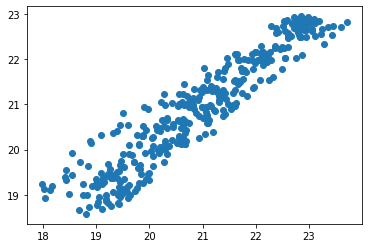

In [4]:
plt.scatter(p_data['TSonicavg']**2*0.0056+0.8097*p_data['TSonicavg']+0.4548, p_data['T_HMP60avg'])
plt.show()

p_data['TSonicavg']=p_data['TSonicavg']**2*0.0056+0.8097*p_data['TSonicavg']+0.4548


(array([3172.,  387.,  111.,   52.,   37.,   16.,    6.,    6.]),
 array([ 0,  8, 16, 24, 32, 40, 48, 56, 64]),
 <a list of 8 Patch objects>)

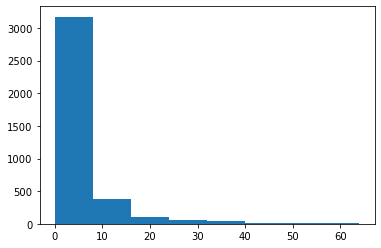

In [5]:
plt.hist(timeScale, bins = [0,8,16,24,32,40,48,56,64])

In [6]:
timeScale = np.sort(timeScale)
print(len(timeScale))
print(next(x[0] for x in enumerate(timeScale) if x[1] > 16)/len(timeScale))
print(timeScale[-100])

3840
0.93125
32.25309306006263


In [7]:
def calculatePmv(ta, tr, vel, rh, met, clo, wme):
      #returns [pmv, ppd]
      #ta, air temperature (°C)
      #tr, mean radiant temperature (°C)
      #vel, relative air speed (m/s)
      #rh, relative humidity (%) Used only this way to input humidity level
      #met, metabolic rate (met)
      #clo, clothing (clo)
      #wme, external work, normally around 0 (met)

    pa = rh * 10 * np.exp(16.6536 - 4030.183 / (ta + 235))
    
    icl = 0.155 * clo #thermal insulation of the clothing in M2K/W
    m = met * 58.15 #metabolic rate in W/M2
    w = wme * 58.15 #external work in W/M2
    mw = m - w #internal heat production in the human body
    
    fcl = 1 + 1.29 * icl if icl <= 0.078 else 1.05 + 0.645 * icl

    #heat transf. coeff. by forced convection
    hcf = 12.1 * np.sqrt(vel)
    taa = ta + 273
    tra = tr + 273
    #we have verified that using the equation below or this tcla = taa + (35.5 - ta) / (3.5 * (6.45 * icl + .1)) does not affect the PMV value
    tcla = taa + (35.5 - ta) / (3.5 * icl + 0.1)

    p1 = icl * fcl
    p2 = p1 * 3.96
    p3 = p1 * 100
    p4 = p1 * taa
    p5 = 308.7 - 0.028 * mw + p2 * (tra / 100) ** 4

    xn = tcla / 100
    xf = tcla / 50
    eps = 0.00015

    n = 0
    hc = 0
    while (np.abs(xn - xf) > eps):
        xf = (xf + xn) / 2
        hcn = 2.38 * np.abs(100.0 * xf - taa) ** 0.25
        hc = hcf if hcf > hcn else hcn

        xn = (p5 + p4 * hc - p2 * xf ** 4) / (100 + p3 * hc)
        n+=1
        if (n > 150):
            print("Max iterations exceeded")
            return 1
        
    

    tcl = 100 * xn - 273;

    #heat loss diff. through skin
    hl1 = 3.05 * 0.001 * (5733 - 6.99 * mw - pa)
    #heat loss by sweating
    hl2 = 0.42 * (mw - 58.15) if (mw > 58.15) else 0
    #latent respiration heat loss
    hl3 = 1.7 * 0.00001 * m * (5867 - pa)
    #dry respiration heat loss
    hl4 = 0.0014 * m * (34 - ta)
    #heat loss by radiation
    hl5 = 3.96 * fcl * (xn ** 4 - (tra / 100) ** 4)
    #heat loss by convection
    hl6 = fcl * hc * (tcl - ta)

    ts = 0.303 * np.exp(-0.036 * m) + 0.028
    pmv = ts * (mw - hl1 - hl2 - hl3 - hl4 - hl5 - hl6)
    ppd = 100.0 - 95.0 * np.exp(-0.03353 * pmv ** 4.0 - 0.2179 * pmv ** 2.0)

    return [pmv,ppd]






for dtime in tqdm(files):
    for point in points:
        PMV= calculatePmv(p_data.loc[(dtime,point),'TSonicavg'], p_data.loc[(dtime,point),'TSonicavg']+0.3, p_data.loc[(dtime,point),'Savg'], p_data.loc[(dtime,point),'RHavg'], 1.4, 0.57, 0)
        p_data.loc[(dtime,point),'PMV1'] = PMV[0]
        p_data.loc[(dtime,point),'PPD1'] = PMV[1]
        
        PMV= calculatePmv(p_data.loc[(dtime,point),'TSonicavg'], p_data.loc[(dtime,point),'TSonicavg']+0.3, p_data.loc[(dtime,point),'Savg'], p_data.loc[(dtime,point),'RHavg'], 1.4, 0.74, 0)
        p_data.loc[(dtime,point),'PMV2'] = PMV[0]
        p_data.loc[(dtime,point),'PPD2'] = PMV[1]
        
        PMV= calculatePmv(p_data.loc[(dtime,point),'TSonicavg'], p_data.loc[(dtime,point),'TSonicavg']+0.3, p_data.loc[(dtime,point),'Savg'], p_data.loc[(dtime,point),'RHavg'], 1.4, 0.96, 0)
        p_data.loc[(dtime,point),'PMV3'] = PMV[0]
        p_data.loc[(dtime,point),'PPD3'] = PMV[1]
        
        PMV= calculatePmv(p_data.loc[(dtime,point),'TSonicavg'], p_data.loc[(dtime,point),'TSonicavg']+0.3, p_data.loc[(dtime,point),'Savg'], p_data.loc[(dtime,point),'RHavg'], 1.7, 0.57, 0)
        p_data.loc[(dtime,point),'PMV4'] = PMV[0]
        p_data.loc[(dtime,point),'PPD4'] = PMV[1]
        
        PMV= calculatePmv(p_data.loc[(dtime,point),'TSonicavg'], p_data.loc[(dtime,point),'TSonicavg']+0.3, p_data.loc[(dtime,point),'Savg'], p_data.loc[(dtime,point),'RHavg'], 1.7, 0.74, 0)
        p_data.loc[(dtime,point),'PMV5'] = PMV[0]
        p_data.loc[(dtime,point),'PPD5'] = PMV[1]
        
        PMV= calculatePmv(p_data.loc[(dtime,point),'TSonicavg'], p_data.loc[(dtime,point),'TSonicavg']+0.3, p_data.loc[(dtime,point),'Savg'], p_data.loc[(dtime,point),'RHavg'], 1.7, 0.96, 0)
        p_data.loc[(dtime,point),'PMV6'] = PMV[0]
        p_data.loc[(dtime,point),'PPD6'] = PMV[1]

100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [00:02<00:00, 16.46it/s]


In [8]:
p_data.loc[('19-30','p3'),:]=np.nan
p_data.loc[('19-30','p4'),:]=np.nan

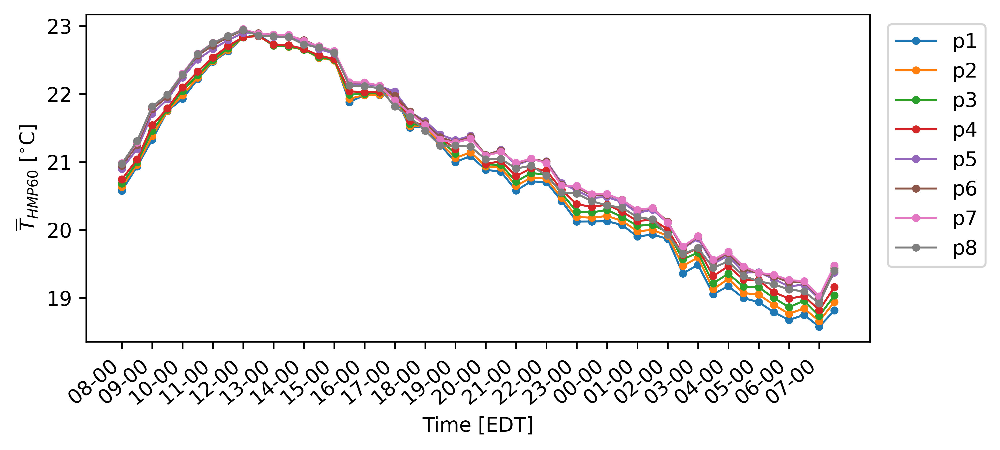

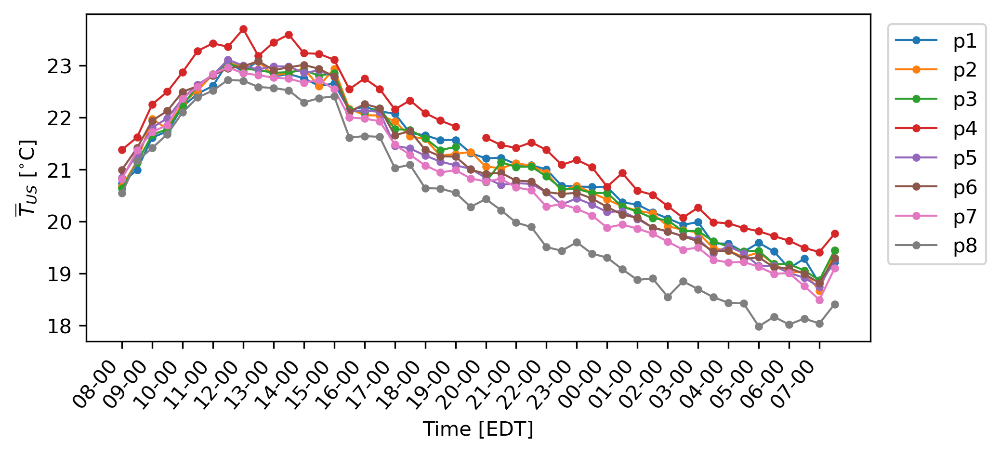

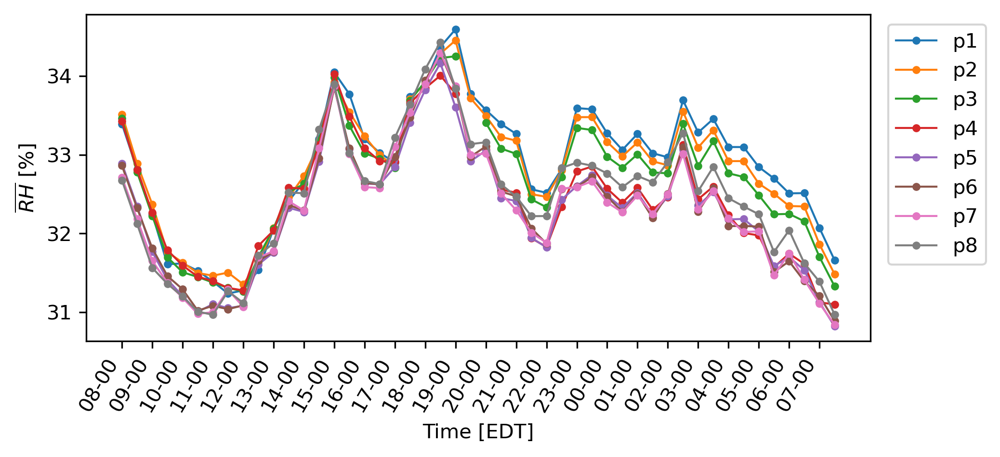

In [9]:
figsavepath = './Analysis/Figures/24Hr_'
points = ['p1','p2','p3','p4','p5','p6','p7','p8']

x_axis_labels = ['16-00','17-00','18-00','19-00',
            '20-00','21-00','22-00','23-00',
            '00-00','01-00','02-00','03-00',
            '04-00','05-00','06-00','07-00',
            '08-00','09-00','10-00','11-00',
            '12-00','13-00','14-00','15-00']

marker = itertools.cycle(('.'))
colors = {'p1':'b'}



fig = plt.figure(figsize=(7,3),dpi=600)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'T_HMP60avg'],marker = next(marker),linewidth=1,label=i)
plt.ylabel(r'$\overline{T}_{HMP60}$ [$^{\circ}$C]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=40,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_HMP60_T_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()


fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'TSonicavg'],marker = next(marker),linewidth=1,label=i)
plt.ylabel(r'$\overline{T}_{US}$ [$^{\circ}$C]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_SonicT_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()


fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'RHavg'],marker = next(marker),linewidth=1,label=i)
plt.ylabel(r'$\overline{RH}$ [%]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=60,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_RH_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

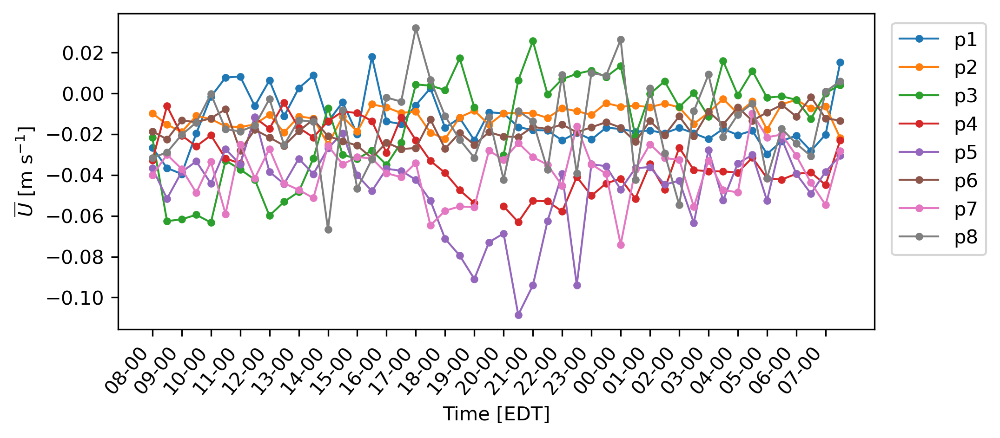

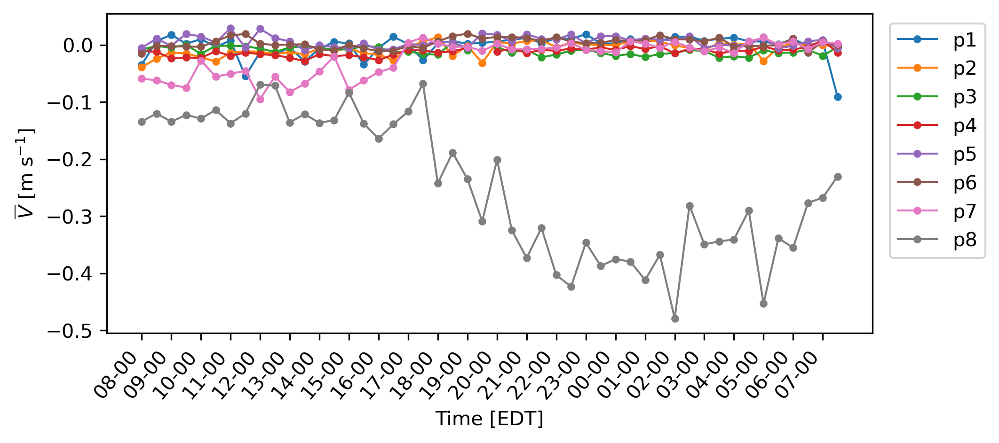

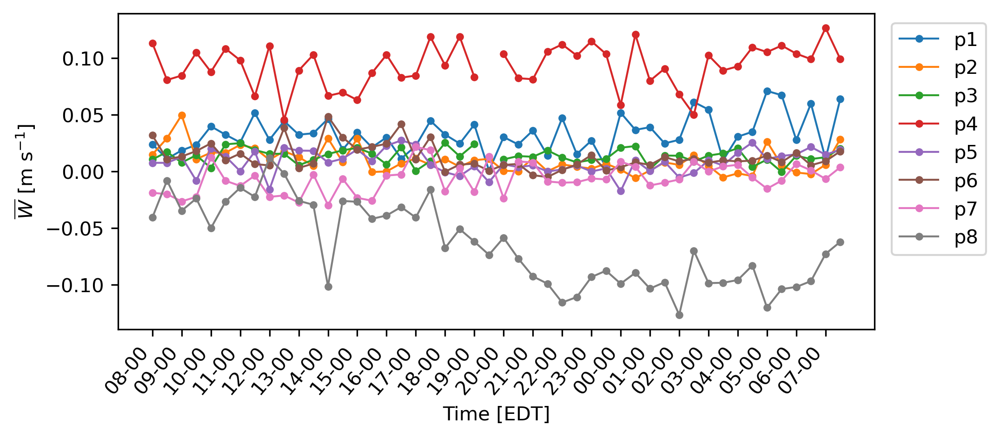

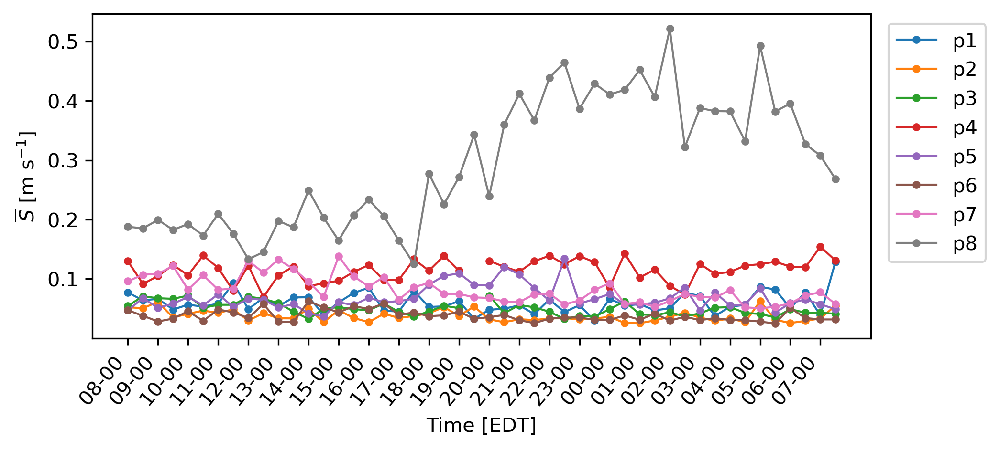

In [10]:
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Uavg'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{U}$ [m s$^{-1}$]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_U_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Vavg'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{V}$ [m s$^{-1}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_V_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Wavg'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{W}$ [m s$^{-1}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_W_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Savg'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{S}$ [m s$^{-1}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_S_avg.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

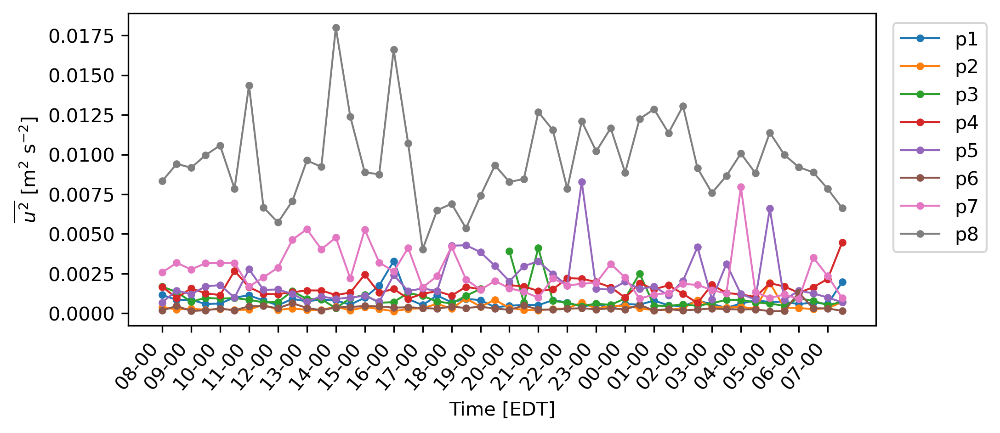

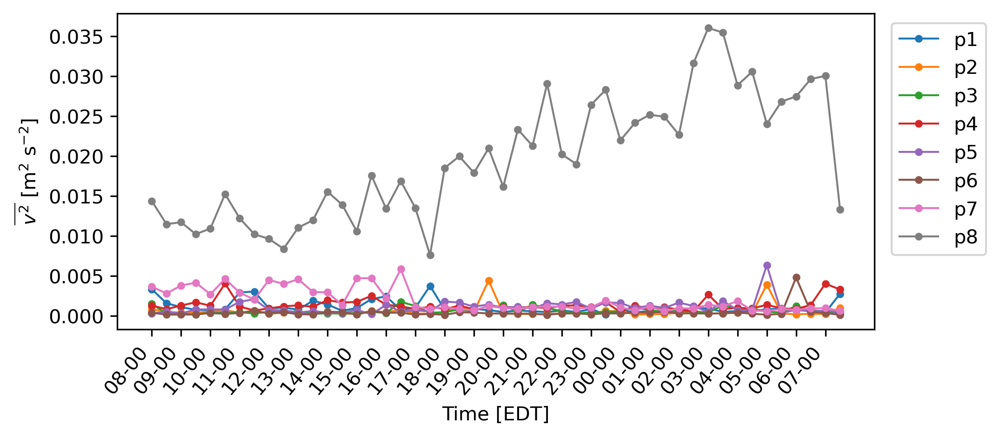

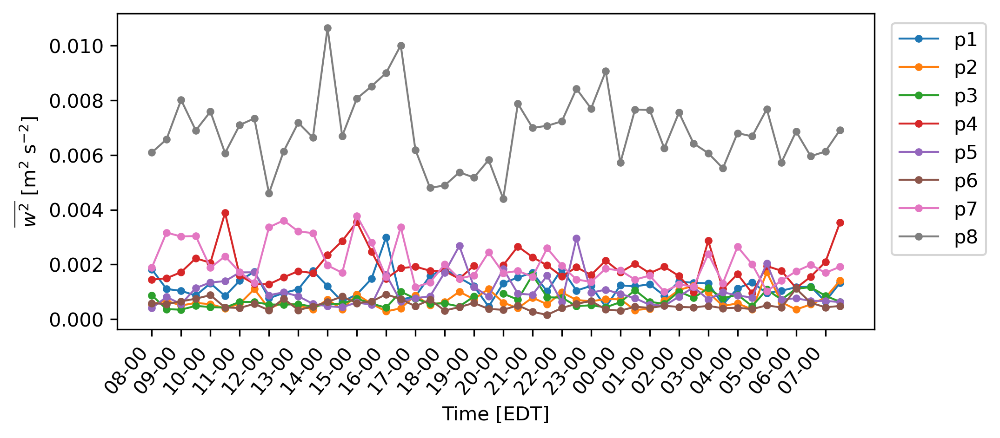

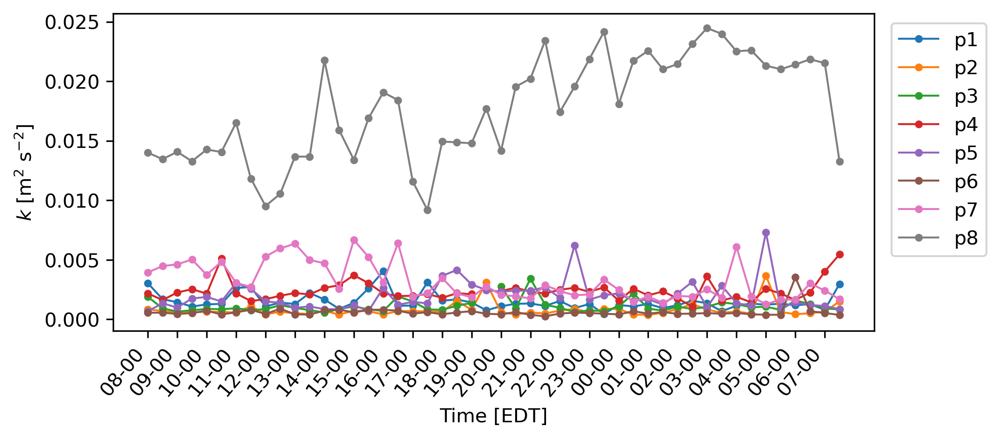

In [11]:
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Uvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{u^2}$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_Uvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Vvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{v^2}$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_Vvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'Wvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{w^2}$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_Wvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'k'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$k$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_k.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

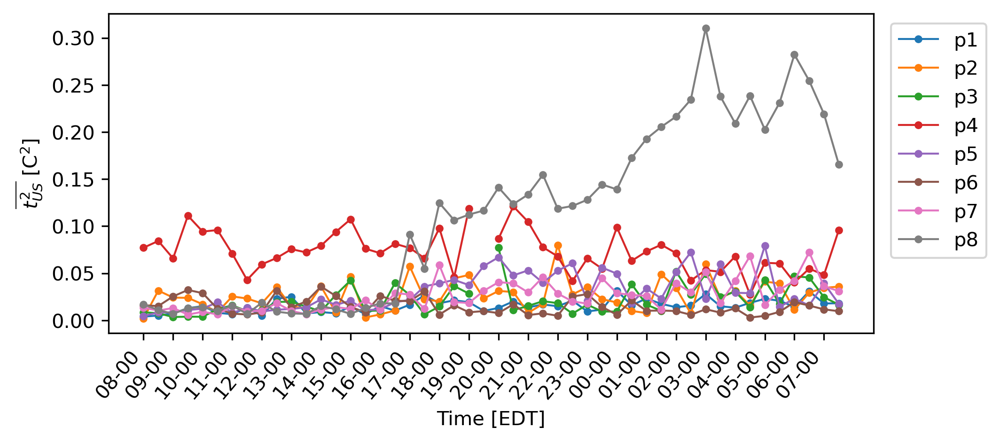

In [19]:
DeltaT=np.max(p_data['TSonicavg'])-np.min(p_data['TSonicavg'])
#print(DeltaT)

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'TSonicvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{t_{US}^2}$ [$^{\circ}$C$^2$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_TSonicvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()


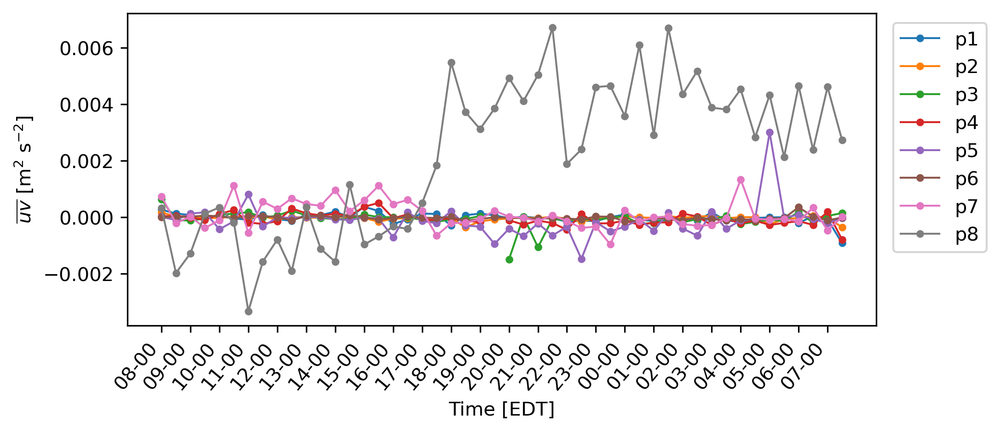

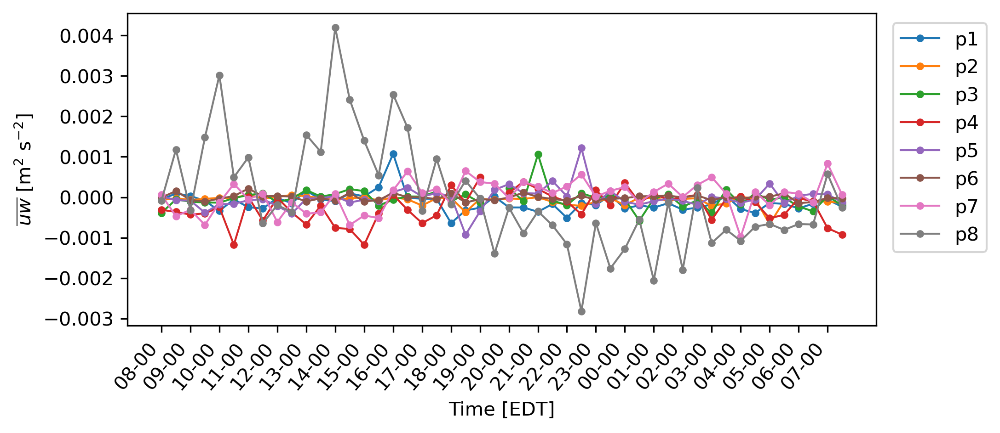

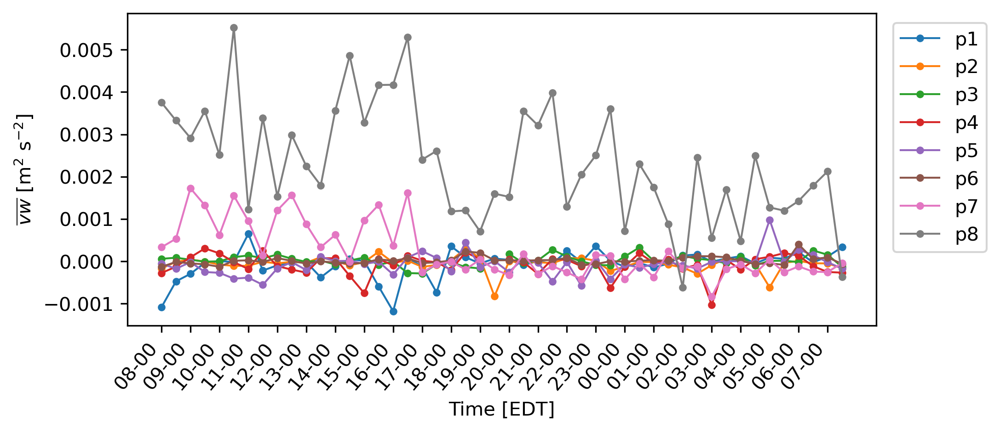

In [13]:
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'UVvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{uv}$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_UVvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'UWvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{uw}$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_UWvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'VWvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{vw}$ [m$^2$ s$^{-2}$]')
xlabel =plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_VWvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

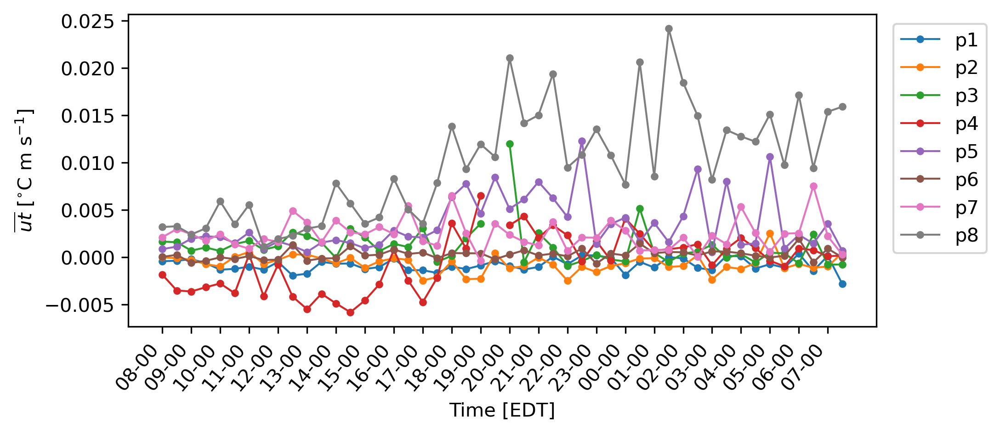

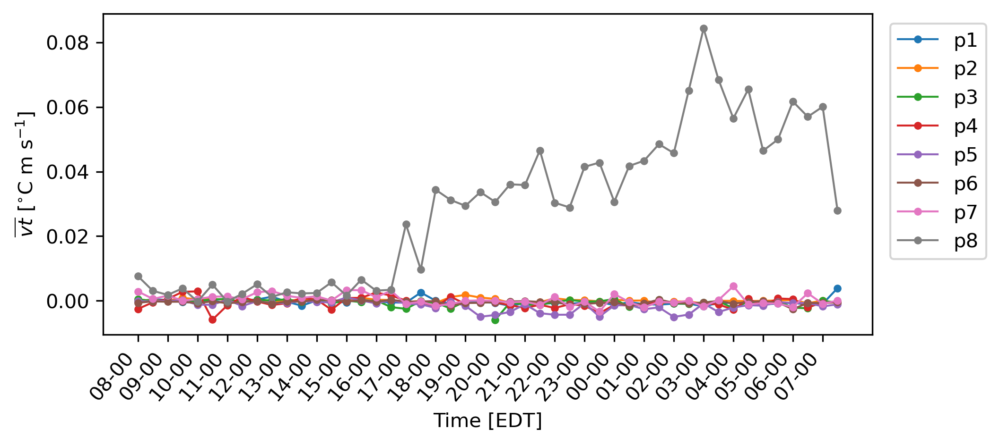

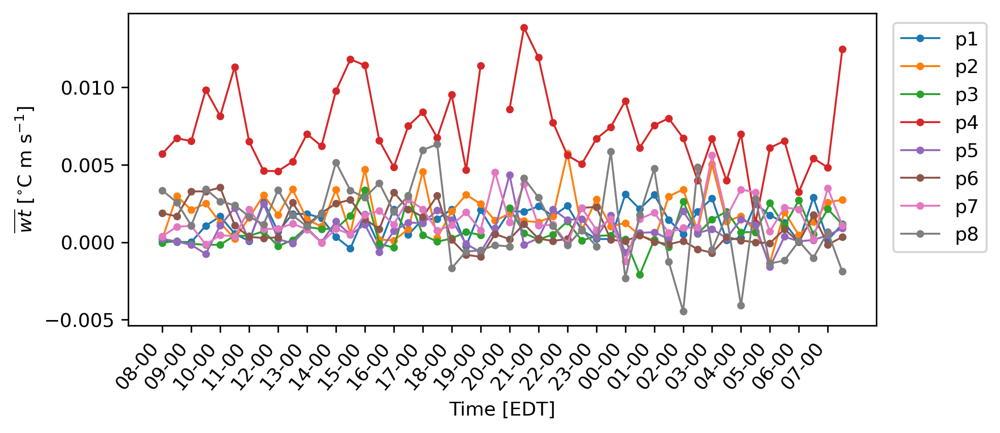

In [21]:
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'UTvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{ut}$ [$^{\circ}$C m s$^{-1}$]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_UTvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'VTvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{vt}$ [$^{\circ}$C m s$^{-1}$]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_VTvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)
for i in points:
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'WTvar'],label=i,marker = next(marker),linewidth=1)
plt.ylabel(r'$\overline{wt}$ [$^{\circ}$C m s$^{-1}$]')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig(figsavepath+'STBE_WTvar.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

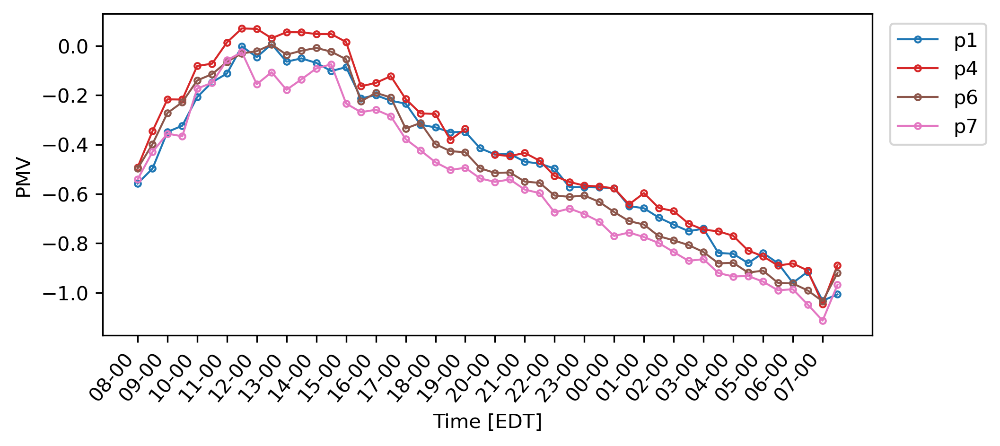

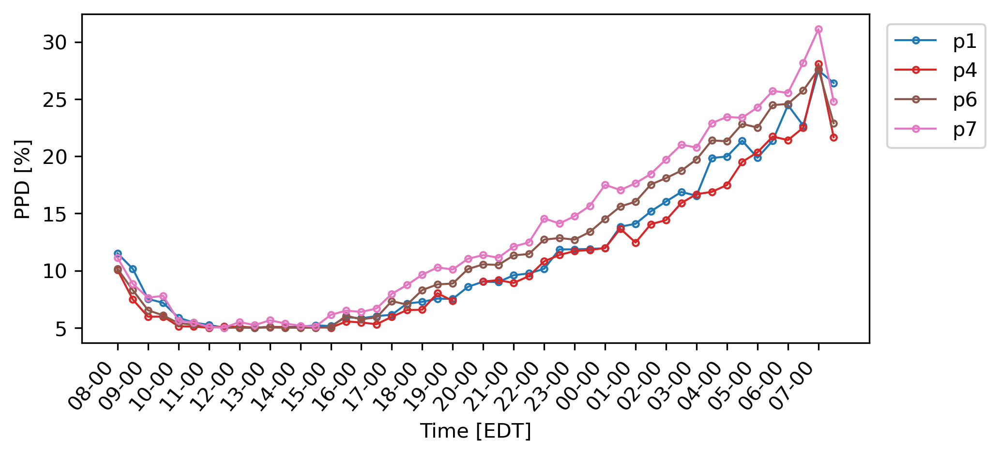

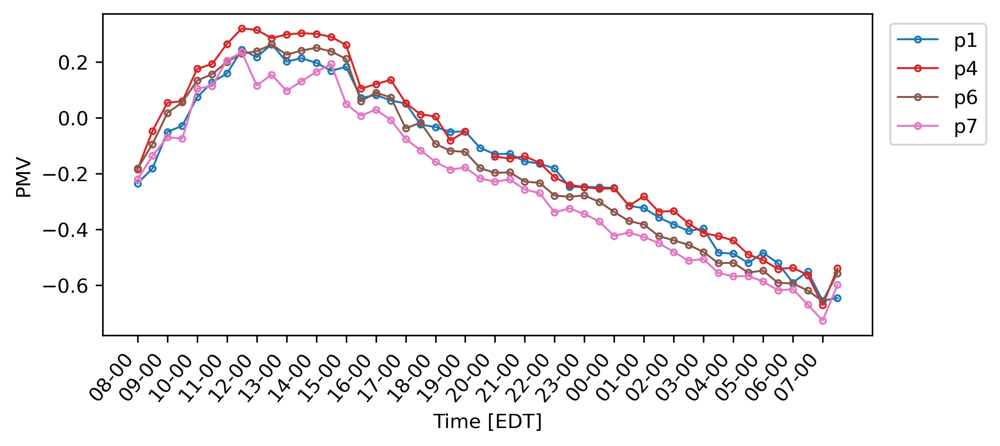

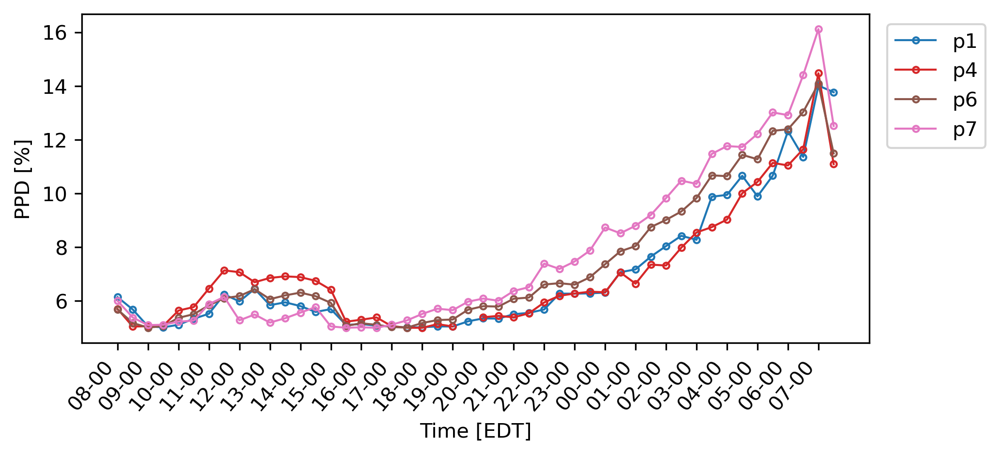

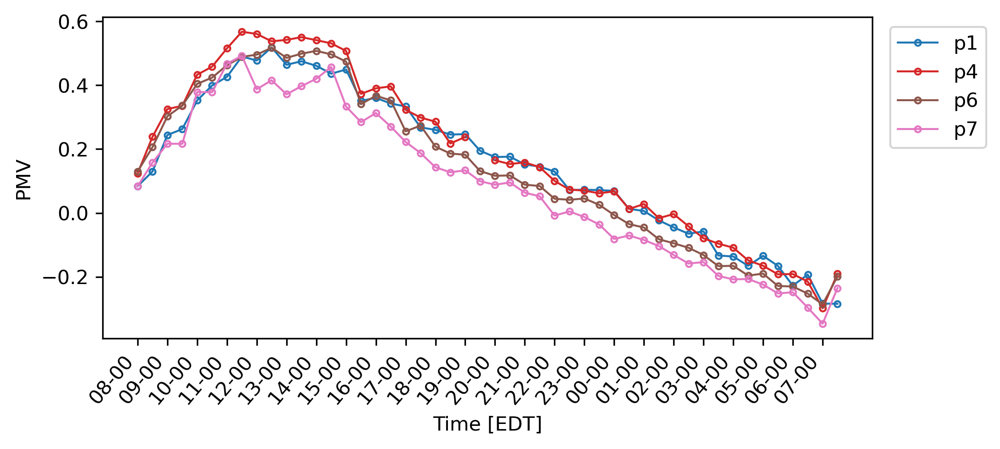

...

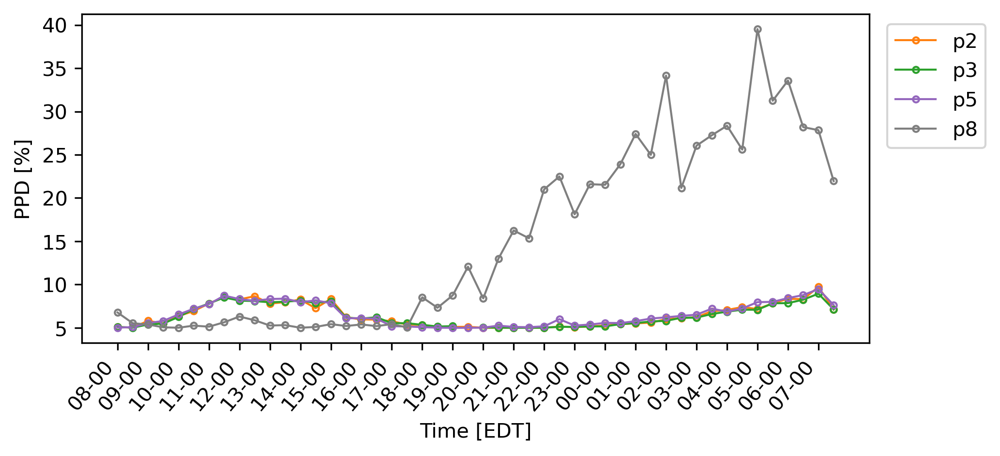

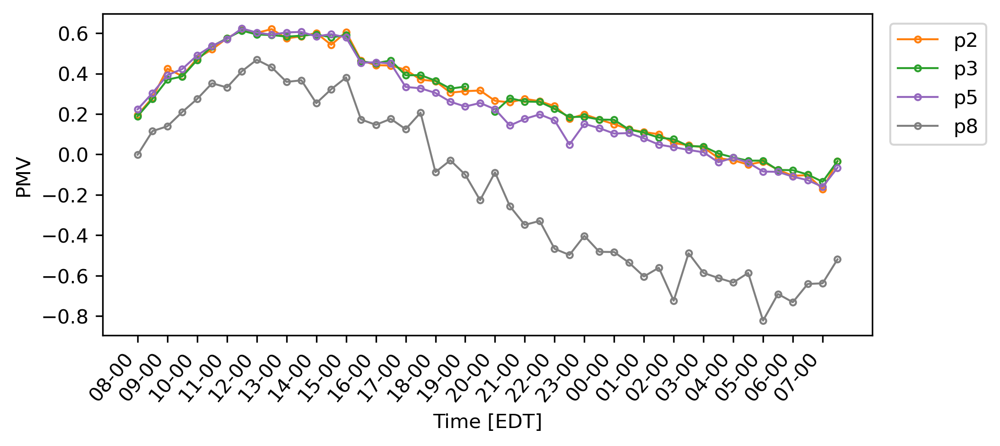

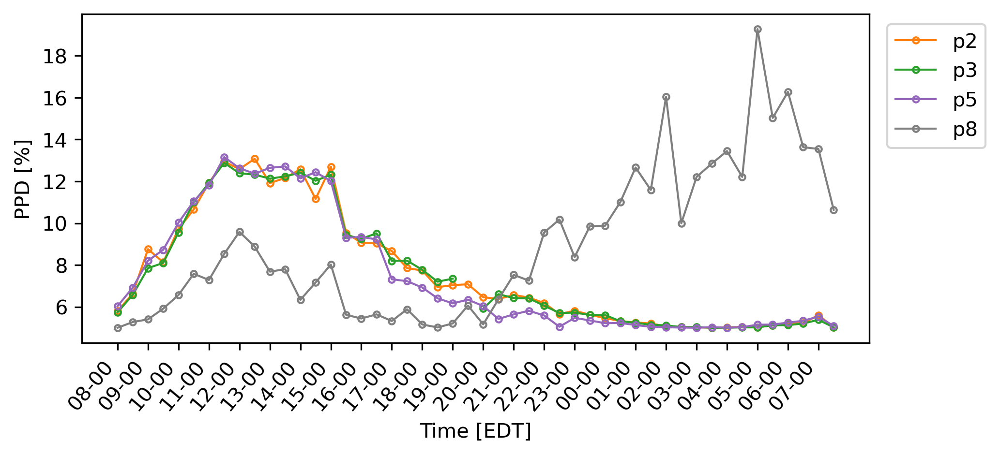

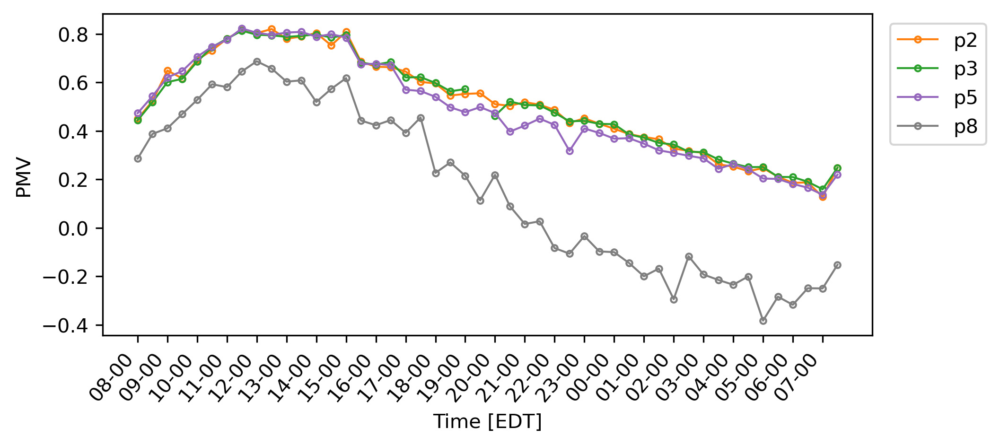

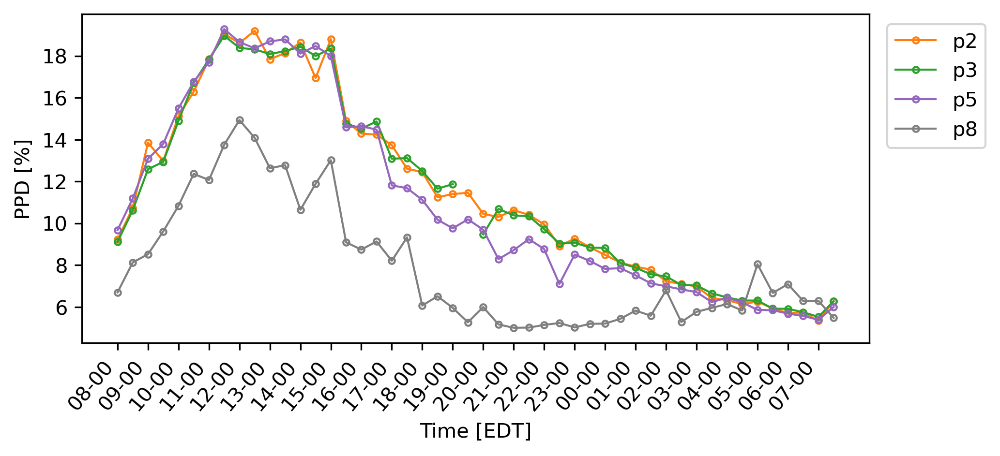

In [15]:
points = ['p1','p4','p6','p7']
color = {'p1':u'#1f77b4', 'p2':u'#ff7f0e', 'p3':u'#2ca02c', 'p4':u'#d62728', 'p5':u'#9467bd', 'p6':u'#8c564b', 'p7':u'#e377c2', 'p8':u'#7f7f7f'}



def PMVfunc(j,points):
    fig = plt.figure(figsize=(7,3),dpi=300)
    ax=plt.subplot(111)
    for i in points:
        ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV'+str(j)],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    plt.ylabel('PMV')
    xlabel = plt.xlabel('Time [EDT]')
    plt.xticks(rotation=50,ha="right")
    lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
    plt.xticks(x_axis_labels)
    plt.savefig(figsavepath+'STBE_PMV'+str(j)+'.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
    #plt.show()

def PPDfunc(j,points):
    fig = plt.figure(figsize=(7,3),dpi=300)
    ax=plt.subplot(111)
    for i in points:
        ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PPD'+str(j)],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    plt.ylabel('PPD [%]')
    xlabel = plt.xlabel('Time [EDT]')
    plt.xticks(rotation=50,ha="right")
    lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
    plt.xticks(x_axis_labels)
    plt.savefig(figsavepath+'STBE_PPD'+str(j)+'.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
    #plt.show()
    
for j in range(1,4):
    PMVfunc(j,['p1','p4','p6','p7'])
    PPDfunc(j,['p1','p4','p6','p7'])
    
for j in range(4,7):
    PMVfunc(j,['p2','p3','p5','p8'])
    PPDfunc(j,['p2','p3','p5','p8'])

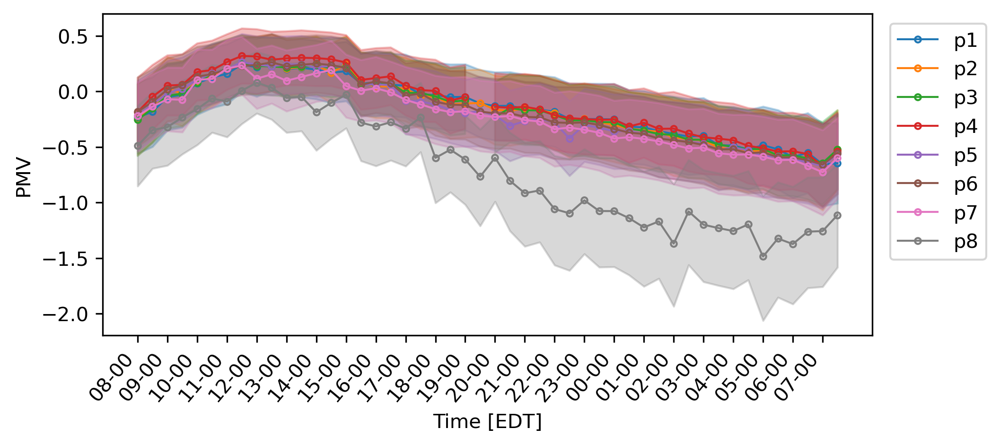

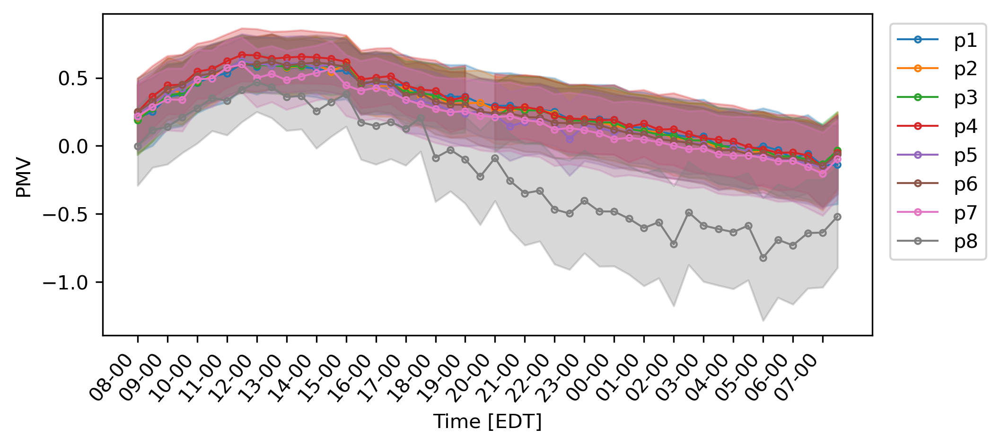

In [22]:
points = ['p1','p2','p3','p4','p5','p6','p7','p8']
#points = ['p1','p4','p6','p7']
color = {'p1':u'#1f77b4', 'p2':u'#ff7f0e', 'p3':u'#2ca02c', 'p4':u'#d62728', 'p5':u'#9467bd', 'p6':u'#8c564b', 'p7':u'#e377c2', 'p8':u'#7f7f7f'}
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)

for i in points:
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV1'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV2'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV3'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    
    ax.fill_between(files,p_data.loc[pd.IndexSlice[:, i], 'PMV1'].tolist(),p_data.loc[pd.IndexSlice[:, i], 'PMV3'].tolist(),color=color[i],alpha=0.3)
    
    

plt.ylabel('PMV')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig('STBE_PMV1.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()


#points = ['p2','p3','p5','p8']
color = {'p1':u'#1f77b4', 'p2':u'#ff7f0e', 'p3':u'#2ca02c', 'p4':u'#d62728', 'p5':u'#9467bd', 'p6':u'#8c564b', 'p7':u'#e377c2', 'p8':u'#7f7f7f'}
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)

for i in points:
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV1'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV5'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV3'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    
    ax.fill_between(files,p_data.loc[pd.IndexSlice[:, i], 'PMV4'].tolist(),p_data.loc[pd.IndexSlice[:, i], 'PMV6'].tolist(),color=color[i],alpha=0.3)
    
    

plt.ylabel('PMV')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig('STBE_PMV2.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()

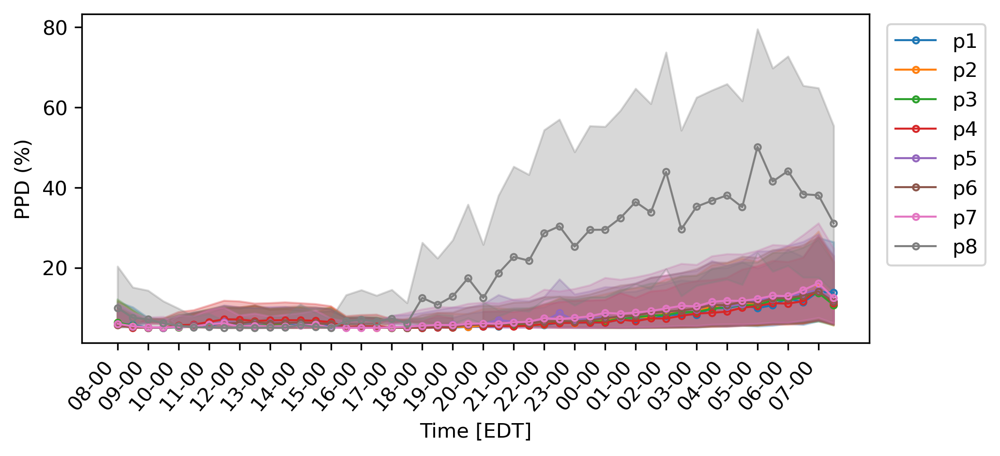

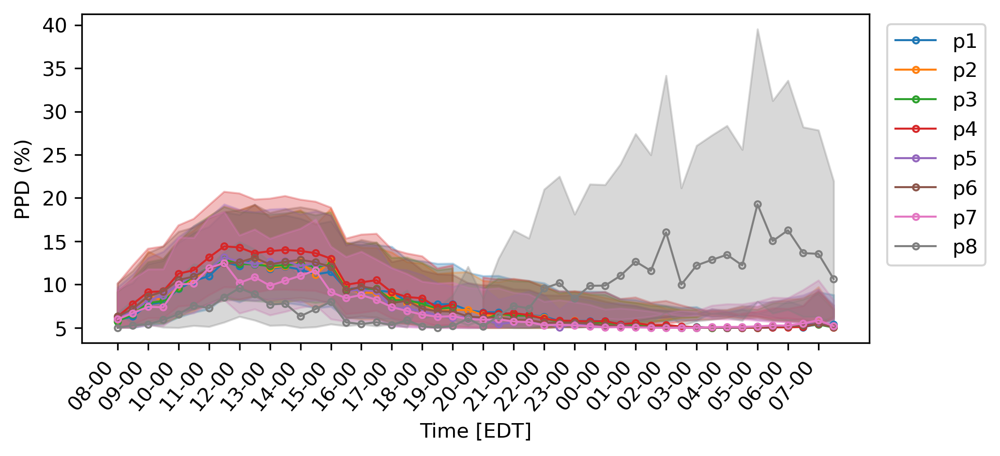

In [23]:
#points = ['p1','p4','p6','p7']
color = {'p1':u'#1f77b4', 'p2':u'#ff7f0e', 'p3':u'#2ca02c', 'p4':u'#d62728', 'p5':u'#9467bd', 'p6':u'#8c564b', 'p7':u'#e377c2', 'p8':u'#7f7f7f'}
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)

for i in points:
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV1'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PPD2'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV3'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    
    ax.fill_between(files,p_data.loc[pd.IndexSlice[:, i], 'PPD1'].tolist(),p_data.loc[pd.IndexSlice[:, i], 'PPD3'].tolist(),color=color[i],alpha=0.3)
    
    

plt.ylabel('PPD (%)')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig('STBE_PPD1.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()


#points = ['p2','p3','p5','p8']
color = {'p1':u'#1f77b4', 'p2':u'#ff7f0e', 'p3':u'#2ca02c', 'p4':u'#d62728', 'p5':u'#9467bd', 'p6':u'#8c564b', 'p7':u'#e377c2', 'p8':u'#7f7f7f'}
fig = plt.figure(figsize=(7,3),dpi=300)
ax=plt.subplot(111)

for i in points:
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV1'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PPD5'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    #ax.plot(files,p_data.loc[pd.IndexSlice[:, i], 'PMV3'],label=i,marker = next(marker),linewidth=1,markerfacecolor='none',c=color[i])
    
    ax.fill_between(files,p_data.loc[pd.IndexSlice[:, i], 'PPD4'].tolist(),p_data.loc[pd.IndexSlice[:, i], 'PPD6'].tolist(),color=color[i],alpha=0.3)
    
    

plt.ylabel('PPD (%)')
xlabel = plt.xlabel('Time [EDT]')
plt.xticks(rotation=50,ha="right")
lgd = ax.legend(bbox_to_anchor=(1.01, 1), loc='upper left')
plt.xticks(x_axis_labels)
plt.savefig('STBE_PPD2.pdf', format='pdf',bbox_extra_artists=(lgd,xlabel), bbox_inches='tight')
plt.show()